# Libraries

In [647]:
import numpy as np
import pandas as pd
from pandasql import sqldf
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from  sklearn.impute import KNNImputer
pysqldf = lambda q: sqldf(q, globals())

# Load Data

In [648]:
polutan_1 = pd.read_csv('../Pollutants/2021 - Indeks Standar Pencemaran Udara (ISPU).csv', sep=';', decimal='.')
polutan_2 = pd.read_csv('../Pollutants/2022 - Indeks Standar Pencemaran Udara (ISPU).csv', sep=';', decimal='.')
polutan_3 = pd.read_csv('../Pollutants/2023 - Indeks Standar Pencemaran Udara (ISPU).csv', sep=';', decimal='.')
polutan_4 = pd.read_csv('../Pollutants/2024 - Indeks Standar Pencemaran Udara (ISPU).csv', sep=';', decimal='.')

cuaca_kemayoran = pd.read_csv('../Meteorological Kemayoran/meteorological kemayoran 2021 - 2024.csv', sep=';', decimal='.')
cuaca_tanjung_priok = pd.read_csv('../Meteorological Tanjung Priok/meteorological tanjung priok 2021-2024.csv', sep=';', decimal='.')

# DKI 1: Bundaran HI (Jakarta Pusat)
# DKI 2: Kelapa Gading (Jakarta Utara)
# DKI 3: Jagakarsa (Jakarta Selatan)
# DKI 4: Lubang buaya (Jakarta Timur)
# DKI 5: Kebon Jeruk (Jakarta Barat)

# Preprocessing Data

Processing Data mencakup:
1. Data Polutan
    - menyamakan format data kosong ke None
    - Memasukkan data polutan per DKI ke axis kolom, agar tidak ada baris tanggal yang duplikat dan agar bisa digabungkan dengan data cuaca
2. Data Cuaca

beberapa yang preprocess manual:

2021
1. Rename value kolom stasiun
    - DKI1 (Bundaran HI) -> DKI1
    - DKI2 (Kelapa Gading) -> DKI2
    - DKI3 (Jagakarsa) -> DKI3
    - DKI4 (Lubang buaya) -> DKI4
    - DKI5 (Kebon Jeruk) -> DKI5

2022
1. lokasi_spku -> stasiun
2. typo pada periode 202202, tahun 2020 -> 2022

2023
1. Rename value kolom stasiun:
    - DKI5 Kebon Jeruk Jakarta Barat & DKI5 Kebon Jeruk -> DKI5
    - DKI1 Bunderan HI -> DKI1
    - DKI2 Kelapa Gading -> DKI2
    - DKI3 Jagakarsa -> DKI3
    - DKI4 Lubang Buaya -> DKI4
2. Rename value parameter pencemar kritis
    - 2 -> PM25
    - 1 -> PM10
    - 5 -> O3
    - 3 -> SO2
3. typo pada periode 202212 -> 202312, 2022 -> 2023

2024
1. Rename value kolom stasiun:
    - DKI5 Kebon Jeruk Jakarta Barat & DKI5 Kebon Jeruk -> DKI5
    - DKI1 Bunderan HI & DKI1 Bundaran Hotel Indonesia (HI) -> DKI1
    - DKI2 Kelapa Gading -> DKI2
    - DKI3 Jagakarsa -> DKI3
    - DKI4 Lubang Buaya -> DKI4

In [649]:
example = np.cos(0), np.sin(0)
example

(np.float64(1.0), np.float64(0.0))

## Data Cuaca

Arah Angin

- (1) C: Calm
- (2) N: North
- (3) NE: North East
- (4) E: East
- (5) SE: South East
- (6) S: South
- (7) SW: South West
- (8) W: West
- (9) NW: North West

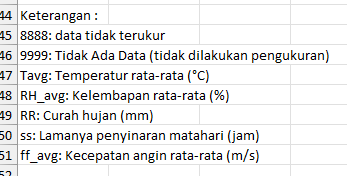

data di 23 oktober 2023 completely blank, use other imputation method

### Kemayoran

In [650]:
cuaca_kemayoran

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR,lat,long,elevation
0,01-01-2021,27,80.0,"13,8",0,1.0,C,-6.155559,106.84,4.0
1,02-01-2021,"27,6",78.0,8888,"2,5",2.0,C,-6.155559,106.84,4.0
2,03-01-2021,"27,9",77.0,NaN,"3,5",2.0,C,-6.155559,106.84,4.0
3,04-01-2021,"28,8",75.0,"9,4","2,7",2.0,C,-6.155559,106.84,4.0
4,05-01-2021,"28,4",76.0,0,"5,2",1.0,C,-6.155559,106.84,4.0
...,...,...,...,...,...,...,...,...,...,...
1436,07-12-2024,"27,7",87.0,8888,"0,2",0.0,C,-6.155559,106.84,4.0
1437,08-12-2024,"28,2",82.0,"30,4","1,4",1.0,C,-6.155559,106.84,4.0
1438,09-12-2024,"27,5",85.0,0,"1,5",0.0,C,-6.155559,106.84,4.0
1439,10-12-2024,"27,7",82.0,26,0,3.0,W,-6.155559,106.84,4.0


In [651]:
cuaca_kemayoran = cuaca_kemayoran.drop(1440)
cuaca_kemayoran = cuaca_kemayoran.drop(columns=['lat', 'long', 'elevation'])

In [652]:
for i in range(len(cuaca_kemayoran['Tanggal'])):
  cuaca_kemayoran['Tanggal'][i] = datetime.strptime(cuaca_kemayoran['Tanggal'][i], '%d-%m-%Y').date()

C:\Users\stevanus.febrian\AppData\Local\Temp\ipykernel_19076\2337747674.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  cuaca_kemayoran['Tanggal'][i] = datetime.strptime(cuaca_kemayoran['Tanggal'][i], '%d-%m-%Y').date()
C:\Users\stevanus

In [653]:
cuaca_kemayoran[['Tavg', 'RR', 'ss']] = cuaca_kemayoran[['Tavg', 'RR', 'ss']].apply(lambda x: x.str.replace(',','.'))

In [654]:
cuaca_kemayoran[['Tavg', 'RR', 'ss']] = cuaca_kemayoran[['Tavg', 'RR', 'ss']].astype(float)

In [655]:
cuaca_kemayoran['DDD_CAR'].unique()

array(['C ', 'NW', 'W ', 'E ', 'SE', 'SW', 'S ', nan, 'C', 'E', 'N', 'W'],
      dtype=object)

In [656]:
cuaca_kemayoran['DDD_CAR'] = cuaca_kemayoran['DDD_CAR'].replace({
  'C': 1,
  'C ': 1,
  'N': 2,
  'NE': 3,
  'E': 4,
  'E ': 4,
  'SE': 5,
  'S': 6,
  'S ': 6,
  'SW': 7,
  'W': 8,
  'W ': 8,
  'NW': 9
})

C:\Users\stevanus.febrian\AppData\Local\Temp\ipykernel_19076\2081814027.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cuaca_kemayoran['DDD_CAR'] = cuaca_kemayoran['DDD_CAR'].replace({


In [657]:
cuaca_kemayoran_processed = cuaca_kemayoran.copy()

In [658]:
cuaca_kemayoran_processed

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2021-01-01,27.0,80.0,13.8,0.0,1.0,1.0
1,2021-01-02,27.6,78.0,8888.0,2.5,2.0,1.0
2,2021-01-03,27.9,77.0,NaN,3.5,2.0,1.0
3,2021-01-04,28.8,75.0,9.4,2.7,2.0,1.0
4,2021-01-05,28.4,76.0,0.0,5.2,1.0,1.0
...,...,...,...,...,...,...,...
1435,2024-12-06,27.1,86.0,48.2,1.5,0.0,1.0
1436,2024-12-07,27.7,87.0,8888.0,0.2,0.0,1.0
1437,2024-12-08,28.2,82.0,30.4,1.4,1.0,1.0
1438,2024-12-09,27.5,85.0,0.0,1.5,0.0,1.0


#### Missing Values

In [659]:
pysqldf(""" select 
        count(*) 
        from cuaca_kemayoran
        where Tavg is null or Tavg = '9999' or Tavg = '8888'
        or RH_avg is null or RH_avg = '9999' or RH_avg = '8888'
        or RR is null or RR = '9999' or RR = '8888'
        or ss is null or ss = '9999' or ss = '8888'
        or ff_avg is null or ff_avg = '9999' or ff_avg = '8888'
""")

,count(*)
0,434


In [660]:
pysqldf(""" select 
        *
        from cuaca_kemayoran
        where Tavg is null and
        RH_avg is null and
        RR is null and
        ss is null and
        ff_avg is null
""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-23,None,None,None,None,None,None


In [661]:
cuaca_kemayoran_processed = cuaca_kemayoran_processed.replace([9999.0, 8888.0], np.nan)

total row: 1440

rows contain null: 434

30.14% data null

#### EDA Univariate

In [662]:
cuaca_kemayoran_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1440 entries, 0 to 1439
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Tanggal  1440 non-null   object 
 1   Tavg     1434 non-null   float64
 2   RH_avg   1436 non-null   float64
 3   RR       1014 non-null   float64
 4   ss       1425 non-null   float64
 5   ff_avg   1439 non-null   float64
 6   DDD_CAR  1439 non-null   float64
dtypes: float64(6), object(1)
memory usage: 78.9+ KB


In [663]:
cuaca_kemayoran_processed = cuaca_kemayoran_processed.set_index('Tanggal')

In [664]:
cuaca_kemayoran_processed.describe()

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
count,1434.000000,1436.000000,1014.000000,1425.000000,1439.000000,1439.000000
mean,28.690028,76.199164,8.048619,4.272912,1.248784,1.568450
std,1.084454,6.160854,16.914937,2.544731,0.638875,1.859271
min,24.800000,56.000000,0.000000,0.000000,0.000000,1.000000
25%,28.000000,72.000000,0.000000,2.200000,1.000000,1.000000
50%,28.800000,76.000000,0.400000,4.500000,1.000000,1.000000
75%,29.400000,80.000000,7.775000,6.500000,2.000000,1.000000
max,31.800000,95.000000,204.000000,9.900000,5.000000,9.000000


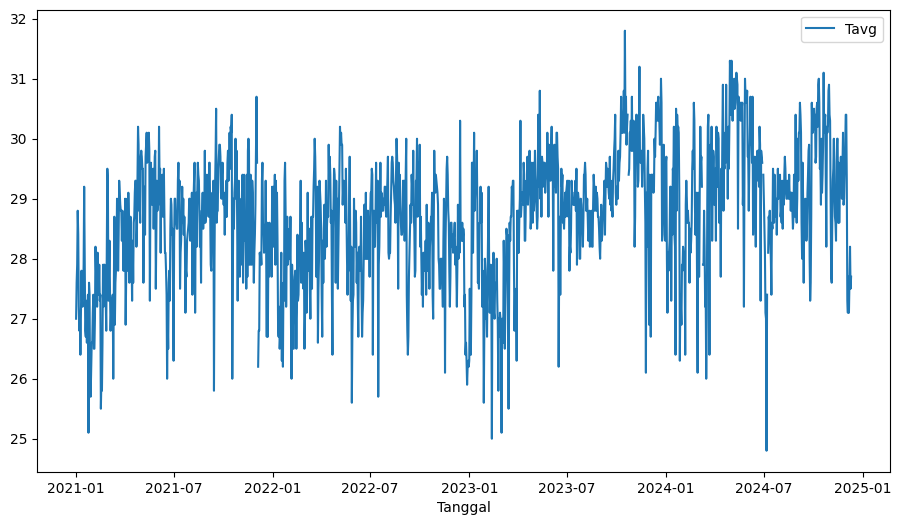

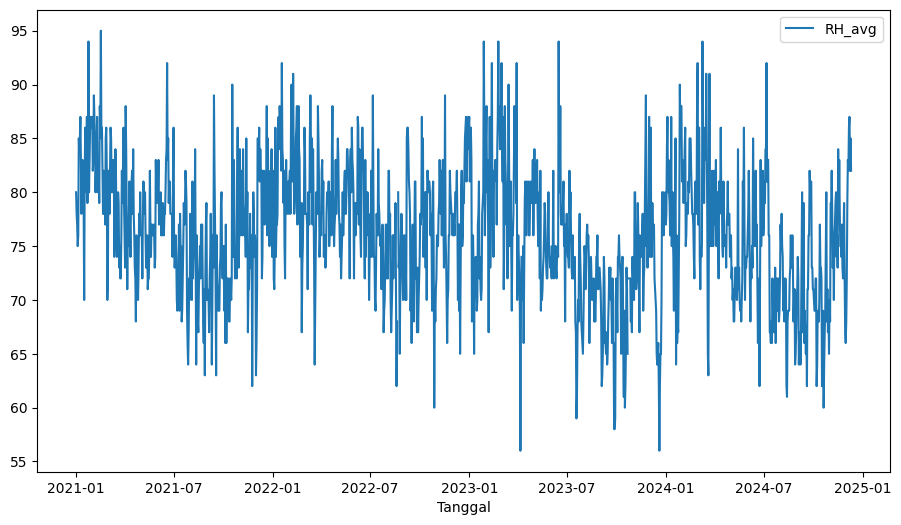

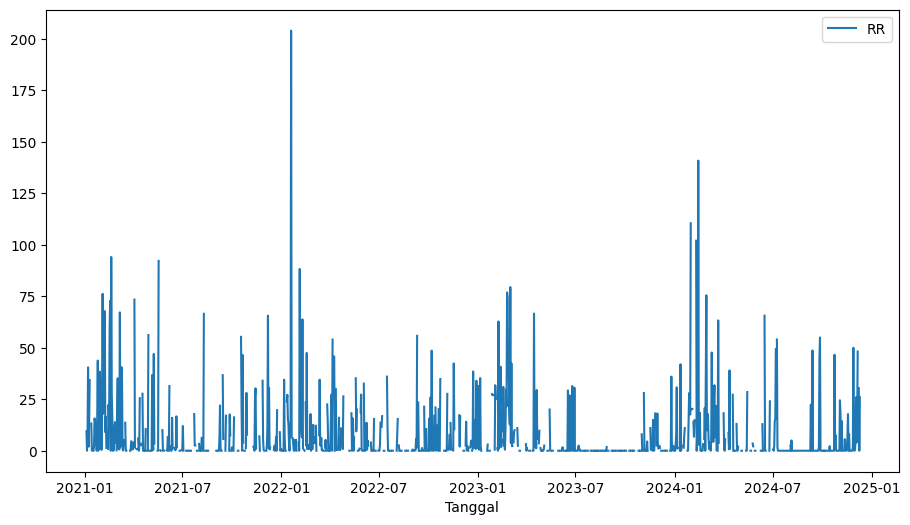

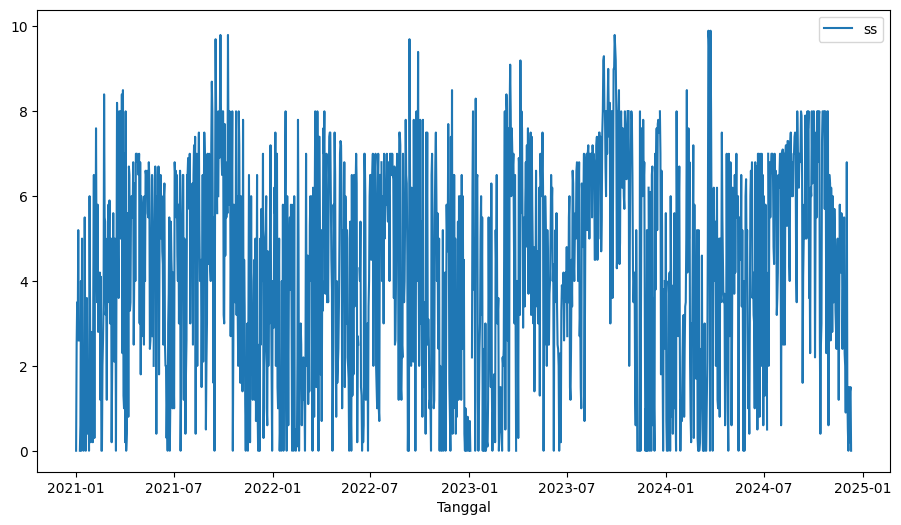

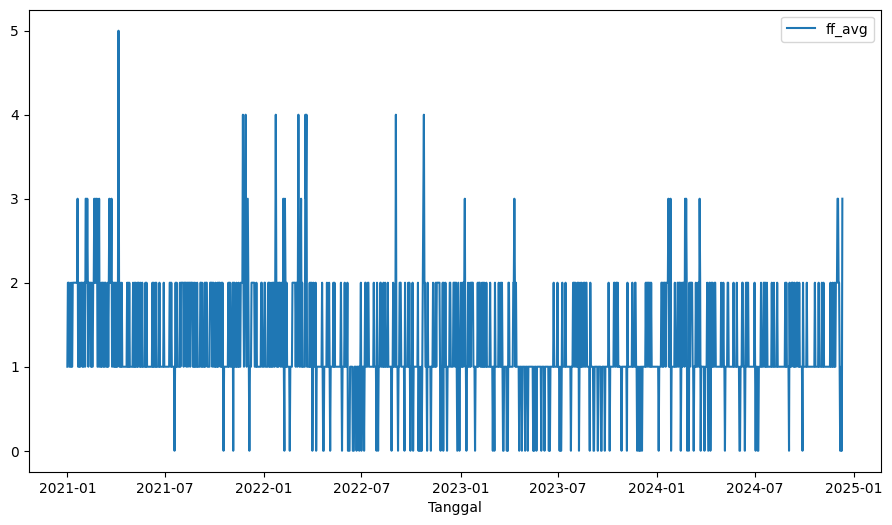

In [665]:
cuaca_kemayoran_processed.plot(y='Tavg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

cuaca_kemayoran_processed.plot(y='RH_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

cuaca_kemayoran_processed.plot(y='RR', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

cuaca_kemayoran_processed.plot(y='ss', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

cuaca_kemayoran_processed.plot(y='ff_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

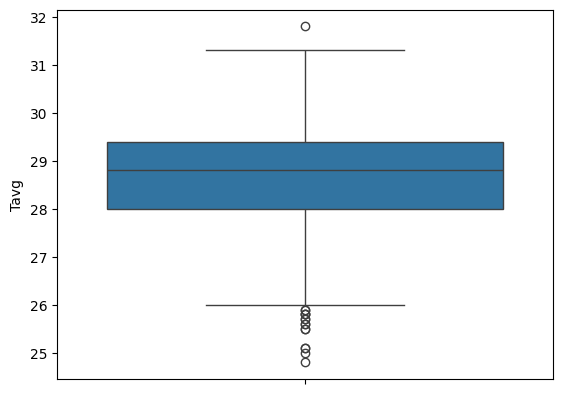

In [666]:
sns.boxplot(y=cuaca_kemayoran_processed['Tavg'])
plt.show()

Text(0, 0.5, 'counts')

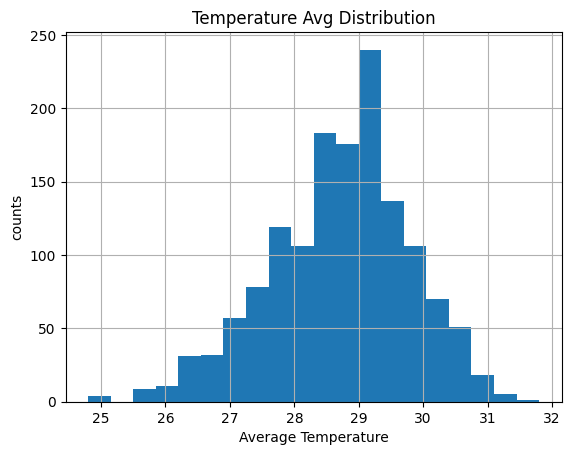

In [667]:
cuaca_kemayoran_processed['Tavg'].hist(bins = 20)
plt.title('Temperature Avg Distribution')
plt.xlabel('Average Temperature')
plt.ylabel('counts')

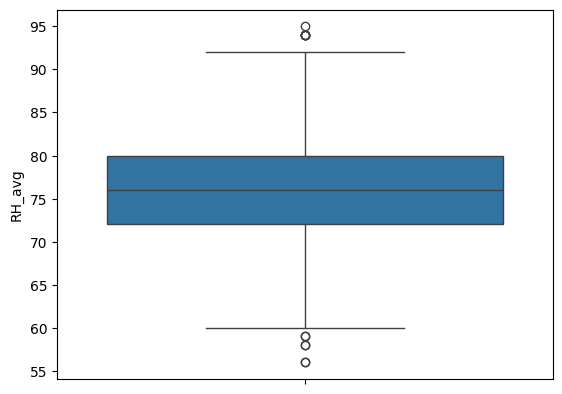

In [668]:
sns.boxplot(y=cuaca_kemayoran_processed['RH_avg'])
plt.show()

Text(0, 0.5, 'count')

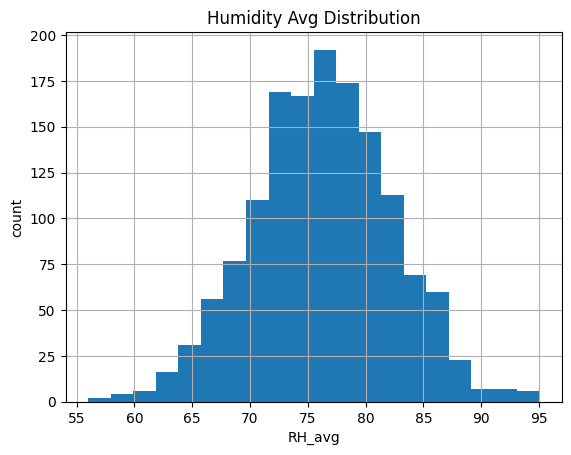

In [669]:
cuaca_kemayoran_processed['RH_avg'].hist(bins = 20)
plt.title('Humidity Avg Distribution')
plt.xlabel('RH_avg')
plt.ylabel('count')

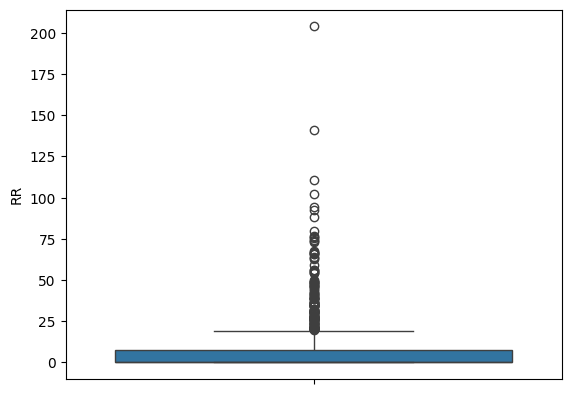

In [670]:
sns.boxplot(y=cuaca_kemayoran_processed['RR'])
plt.show()

Text(0, 0.5, 'count')

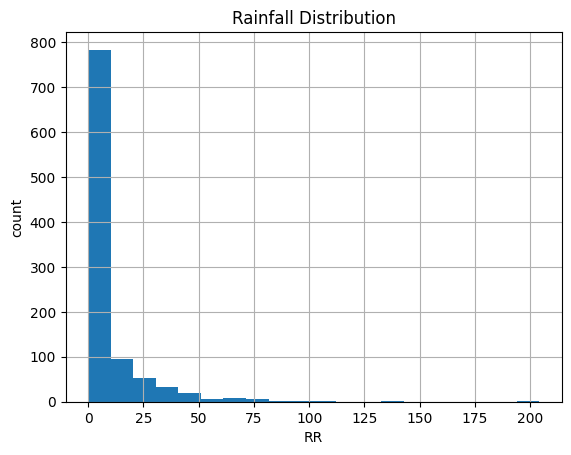

In [671]:
cuaca_kemayoran_processed['RR'].hist(bins = 20)
plt.title('Rainfall Distribution')
plt.xlabel('RR')
plt.ylabel('count')

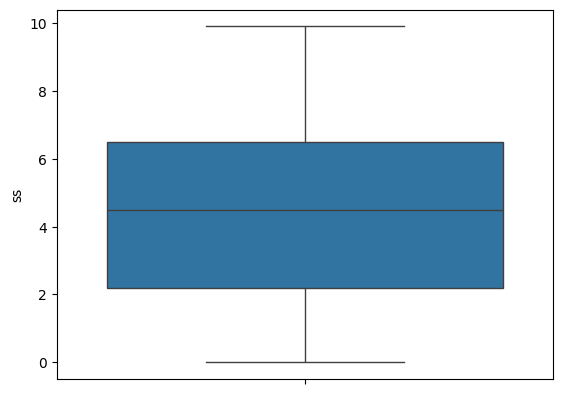

In [672]:
sns.boxplot(y=cuaca_kemayoran_processed['ss'])
plt.show()

Text(0, 0.5, 'count')

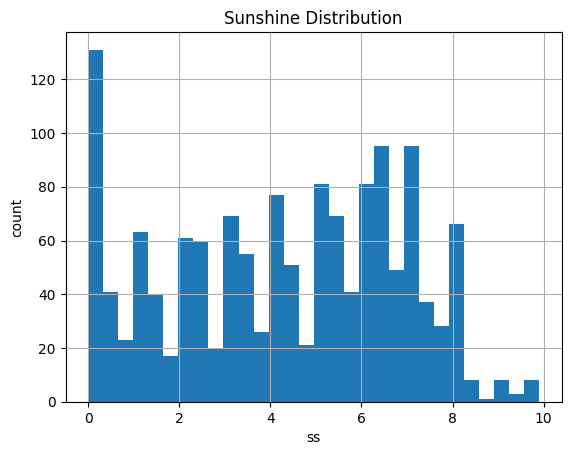

In [673]:
cuaca_kemayoran_processed['ss'].hist(bins = 30)
plt.title('Sunshine Distribution')
plt.xlabel('ss')
plt.ylabel('count')

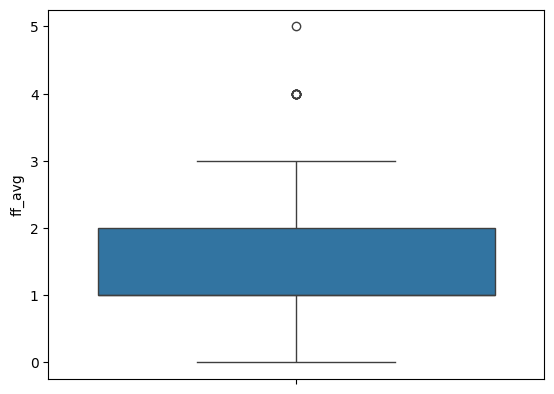

In [674]:
sns.boxplot(y=cuaca_kemayoran_processed['ff_avg'])
plt.show()

Text(0, 0.5, 'count')

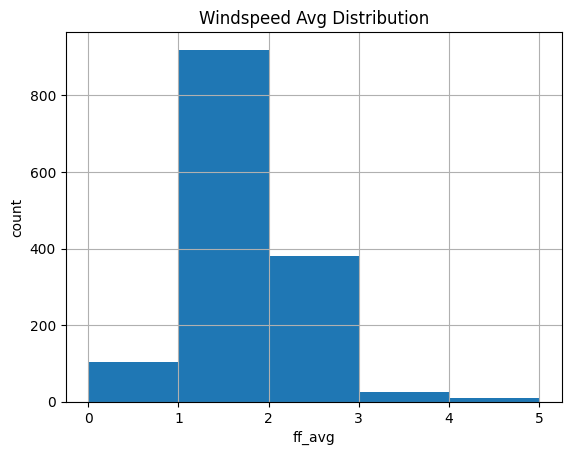

In [675]:
cuaca_kemayoran_processed['ff_avg'].hist(bins = 5)
plt.title('Windspeed Avg Distribution')
plt.xlabel('ff_avg')
plt.ylabel('count')

TRENDS
- tren Tavg semakin naik
- tren RH_avg cenderung semakin turun

DISTRIBUTIONS:
- Tavg & RH_avg mempunyai bentuk distribusi normal yang sedikit right skew

#### EDA Bivariate

In [676]:
list(cuaca_kemayoran_processed[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].columns)

['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']

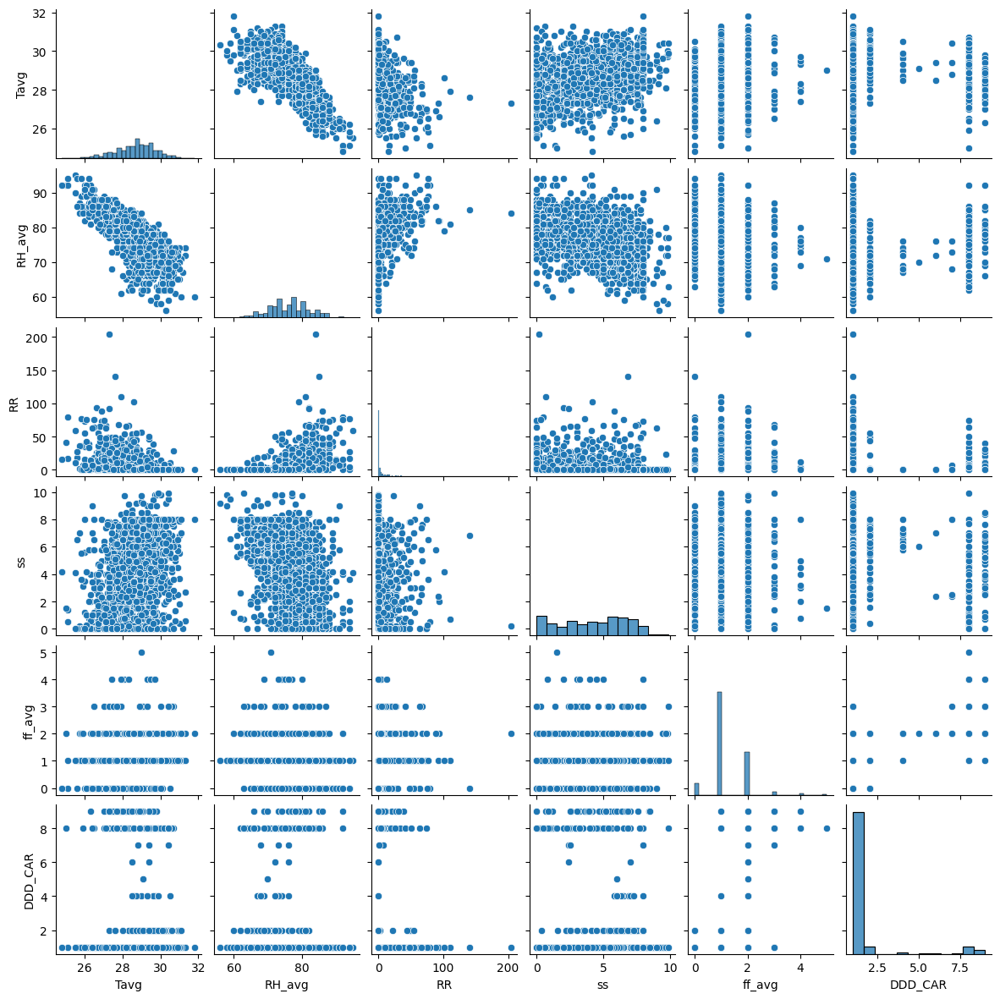

In [677]:
sns.pairplot(cuaca_kemayoran_processed, height=2)

Temperature
- LOWER Temperature - HIGHER Humidity
- LOWER Temperature - cenderung HIGHER Rainfall
- HIGHER Temperature - cendurung HIGHER Sunshine

Humidity
- HIGHER Humidity - cenderung HIGHER Rainfall
- HIGHER Humidity - cenderung LOWER sunshine

Else is hard to see the correlation

#### Impute Data

In [678]:
cuaca_kemayoran_processed

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
Tanggal,,,,,,
2021-01-01,27.0,80.0,13.8,0.0,1.0,1.0
2021-01-02,27.6,78.0,NaN,2.5,2.0,1.0
2021-01-03,27.9,77.0,NaN,3.5,2.0,1.0
2021-01-04,28.8,75.0,9.4,2.7,2.0,1.0
2021-01-05,28.4,76.0,0.0,5.2,1.0,1.0
...,...,...,...,...,...,...
2024-12-06,27.1,86.0,48.2,1.5,0.0,1.0
2024-12-07,27.7,87.0,NaN,0.2,0.0,1.0
2024-12-08,28.2,82.0,30.4,1.4,1.0,1.0


In [679]:
# KNN
imputer = KNNImputer()
imputed_cuaca_kemayoran = pd.concat(
  [
    pd.DataFrame({
      'Tanggal': cuaca_kemayoran['Tanggal']
    }),
    pd.DataFrame(imputer.fit_transform(cuaca_kemayoran_processed),columns = ['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR'])
  ], axis=1
)

In [680]:
imputed_cuaca_kemayoran

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2021-01-01,27.0,80.0,13.80,0.0,1.0,1.0
1,2021-01-02,27.6,78.0,2.26,2.5,2.0,1.0
2,2021-01-03,27.9,77.0,2.12,3.5,2.0,1.0
3,2021-01-04,28.8,75.0,9.40,2.7,2.0,1.0
4,2021-01-05,28.4,76.0,0.00,5.2,1.0,1.0
...,...,...,...,...,...,...,...
1435,2024-12-06,27.1,86.0,48.20,1.5,0.0,1.0
1436,2024-12-07,27.7,87.0,7.56,0.2,0.0,1.0
1437,2024-12-08,28.2,82.0,30.40,1.4,1.0,1.0
1438,2024-12-09,27.5,85.0,0.00,1.5,0.0,1.0


In [681]:
imputed_cuaca_kemayoran[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = imputed_cuaca_kemayoran[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].round(1)
imputed_cuaca_kemayoran[['RH_avg', 'DDD_CAR']] = imputed_cuaca_kemayoran[['RH_avg', 'DDD_CAR']].round(0)

In [682]:
# Interpolation in 23 October 2023
pysqldf("""select * from imputed_cuaca_kemayoran where Tanggal in ('2023-10-20', '2023-10-21', '2023-10-22', '2023-10-23', '2023-10-24', '2023-10-25', '2023-10-26')""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-20,29.9,73.0,3.0,6.4,2.0,1.0
1,2023-10-21,30.2,71.0,0.0,7.2,1.0,1.0
2,2023-10-22,30.4,65.0,0.0,8.0,1.0,1.0
3,2023-10-23,28.7,76.0,8.0,4.3,1.2,2.0
4,2023-10-24,29.4,72.0,0.0,8.0,1.0,1.0
5,2023-10-25,29.5,72.0,0.0,2.0,1.0,1.0
6,2023-10-26,30.1,72.0,0.0,4.4,1.0,1.0


In [683]:
# Linear Interpolation
imputed_cuaca_kemayoran.loc[imputed_cuaca_kemayoran['Tanggal'] == datetime.strptime('23-10-2023', '%d-%m-%Y').date(), ['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = np.nan
imputed_cuaca_kemayoran[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = imputed_cuaca_kemayoran[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].interpolate(method ='linear', limit_direction ='forward')

In [684]:
# Interpolation in 23 October 2023
pysqldf("""select * from imputed_cuaca_kemayoran where Tanggal in ('2023-10-20', '2023-10-21', '2023-10-22', '2023-10-23', '2023-10-24', '2023-10-25', '2023-10-26')""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-20,29.9,73.0,3.0,6.4,2.0,1.0
1,2023-10-21,30.2,71.0,0.0,7.2,1.0,1.0
2,2023-10-22,30.4,65.0,0.0,8.0,1.0,1.0
3,2023-10-23,29.9,68.5,0.0,8.0,1.0,1.0
4,2023-10-24,29.4,72.0,0.0,8.0,1.0,1.0
5,2023-10-25,29.5,72.0,0.0,2.0,1.0,1.0
6,2023-10-26,30.1,72.0,0.0,4.4,1.0,1.0


In [685]:
# imputed_cuaca_kemayoran = imputed_cuaca_kemayoran.set_index(imputed_cuaca_kemayoran['Tanggal'])

#### EDA After Cleaning & Preprocess

In [686]:
imputed_cuaca_kemayoran.describe()

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
count,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000
mean,28.688264,76.192708,7.282500,4.278194,1.248611,1.568056
std,1.085411,6.156166,14.810188,2.539916,0.638686,1.858686
min,24.800000,56.000000,0.000000,0.000000,0.000000,1.000000
25%,28.000000,72.000000,0.000000,2.200000,1.000000,1.000000
50%,28.800000,76.000000,1.000000,4.500000,1.000000,1.000000
75%,29.400000,80.000000,8.425000,6.500000,2.000000,1.000000
max,31.800000,95.000000,204.000000,9.900000,5.000000,9.000000


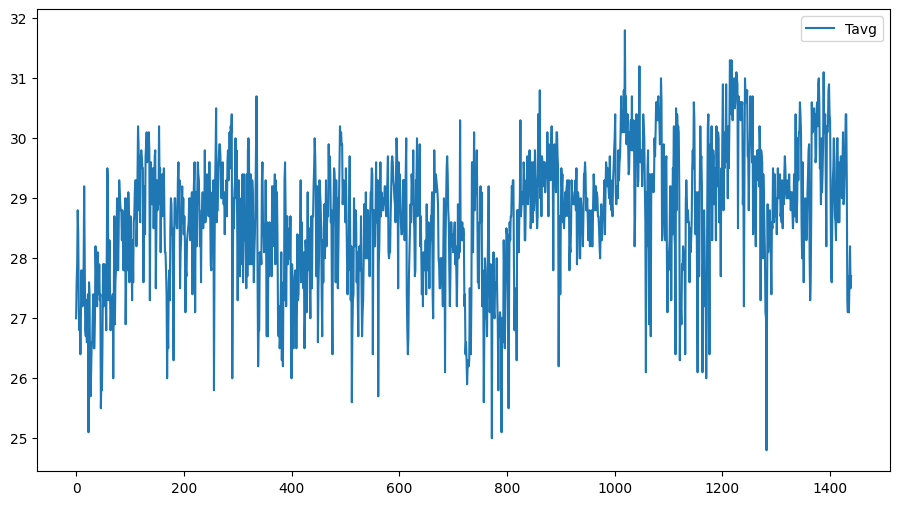

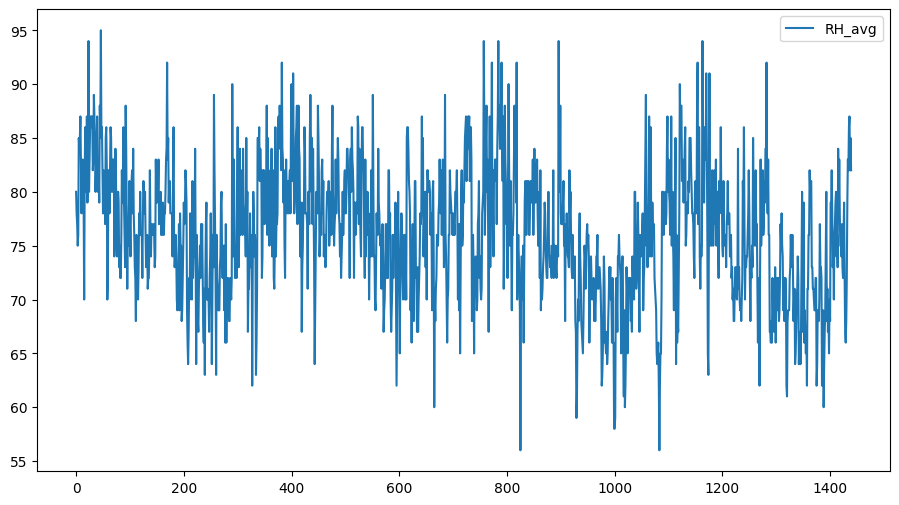

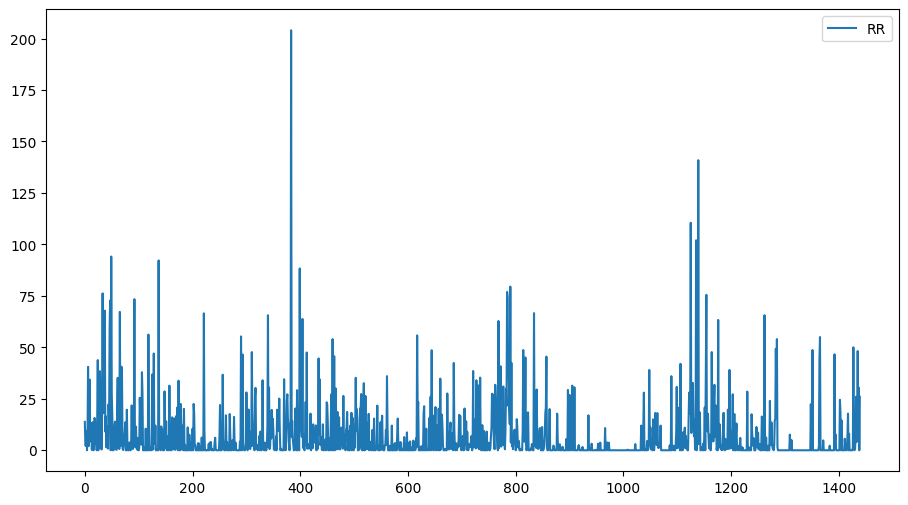

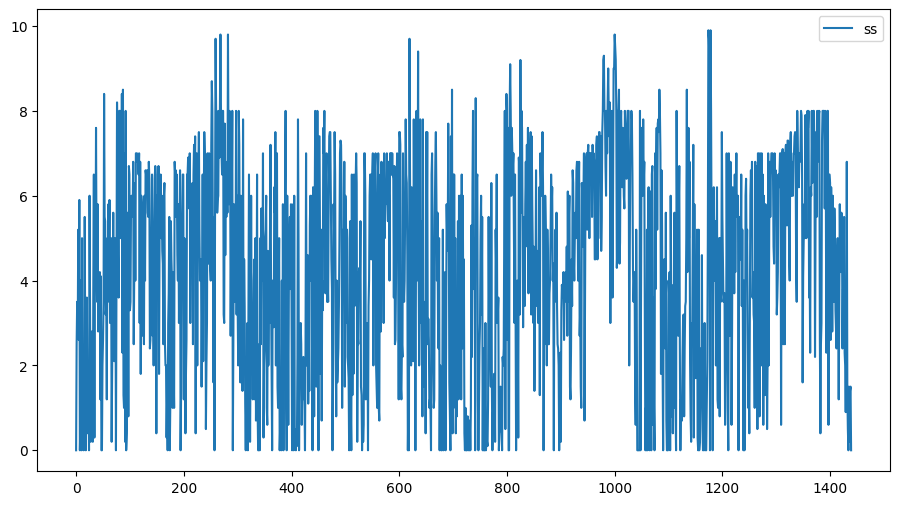

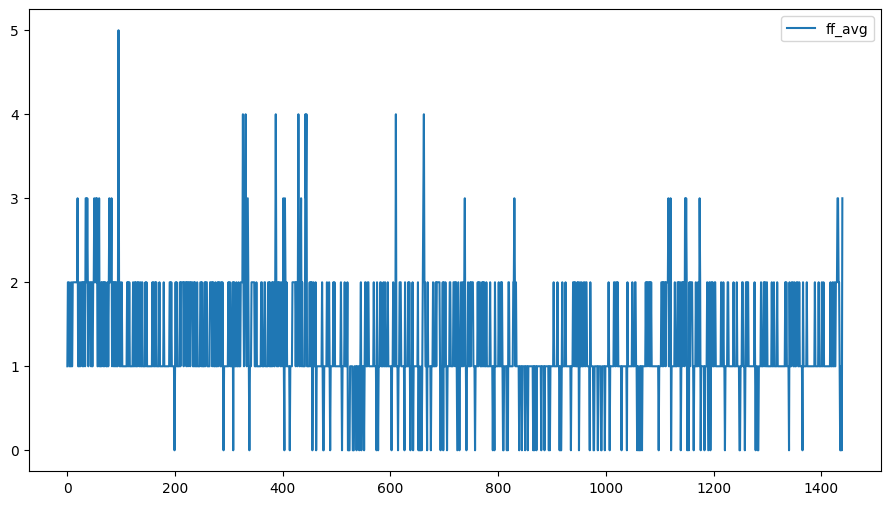

In [687]:
imputed_cuaca_kemayoran.plot(y='Tavg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

imputed_cuaca_kemayoran.plot(y='RH_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

imputed_cuaca_kemayoran.plot(y='RR', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

imputed_cuaca_kemayoran.plot(y='ss', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

imputed_cuaca_kemayoran.plot(y='ff_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

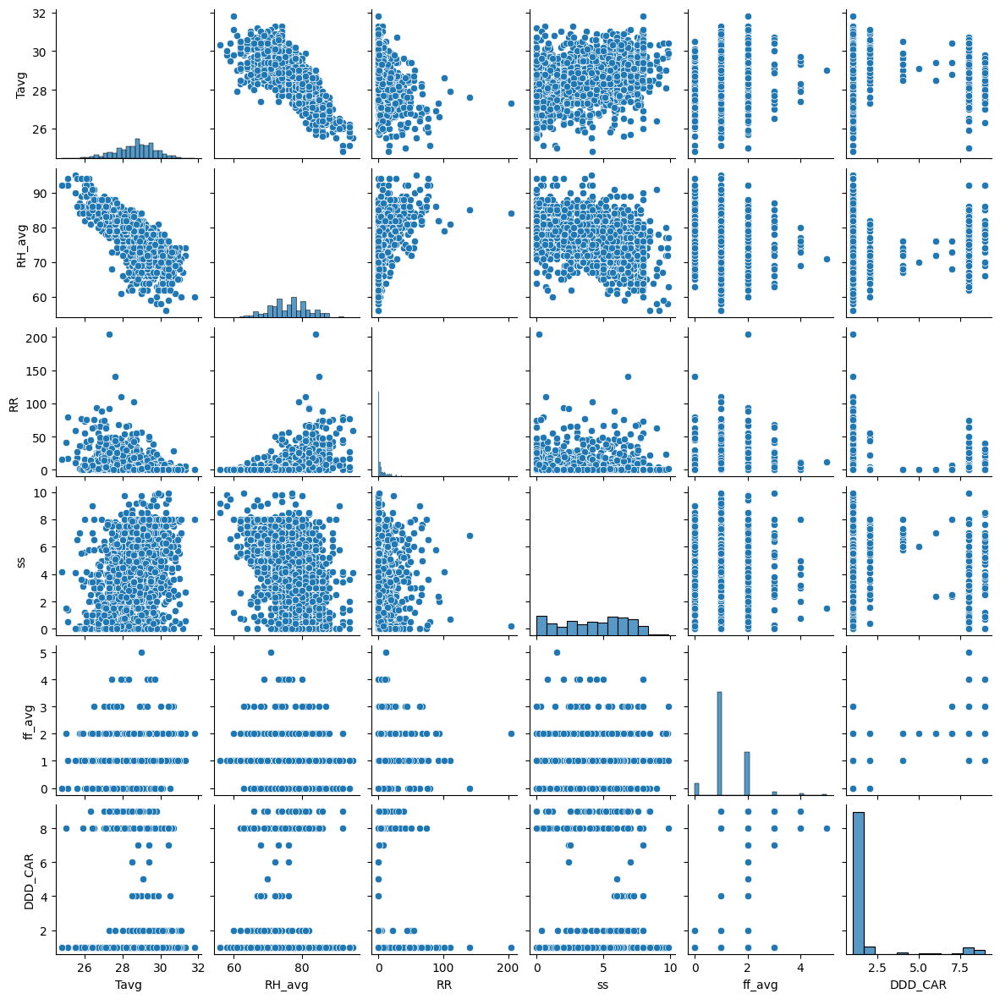

In [688]:
sns.pairplot(imputed_cuaca_kemayoran, height=2)

Rainfall menjadi kolom dengan jumlah imputasi paling banyak (300) data, namun tetap tidak terlihat perubahan yang berarti

### Tanjung Priok

In [689]:
cuaca_tanjung_priok = cuaca_tanjung_priok.drop(columns=['lat', 'long', 'elevation'])

In [690]:
cuaca_tanjung_priok

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,01/01/2021,"26,9",85.0,"7,7",0,2.0,W
1,02/01/2021,"27,3",82.0,"0,5","2,9",3.0,NW
2,03/01/2021,28,82.0,NaN,"5,5",3.0,W
3,04/01/2021,"28,6",79.0,"2,8","2,5",3.0,W
4,05/01/2021,"27,8",84.0,NaN,7,2.0,W
...,...,...,...,...,...,...,...
1435,06/12/2024,"27,2",86.0,"63,4","2,2",1.0,C
1436,07/12/2024,"28,1",85.0,8888,0,1.0,C
1437,08/12/2024,"28,3",86.0,19,"3,1",1.0,C
1438,09/12/2024,"26,3",94.0,"2,5","3,5",1.0,C


In [691]:
for i in range(len(cuaca_tanjung_priok['Tanggal'])):
  cuaca_tanjung_priok['Tanggal'][i] = datetime.strptime(cuaca_tanjung_priok['Tanggal'][i], '%d/%m/%Y').date()

C:\Users\stevanus.febrian\AppData\Local\Temp\ipykernel_19076\3638577013.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  cuaca_tanjung_priok['Tanggal'][i] = datetime.strptime(cuaca_tanjung_priok['Tanggal'][i], '%d/%m/%Y').date()
C:\Users\

In [692]:
cuaca_tanjung_priok[['Tavg', 'RR', 'ss']] = cuaca_tanjung_priok[['Tavg', 'RR', 'ss']].apply(lambda x: x.str.replace(',','.'))
cuaca_tanjung_priok[['Tavg', 'RR', 'ss']] = cuaca_tanjung_priok[['Tavg', 'RR', 'ss']].astype(float)


In [693]:
cuaca_tanjung_priok['DDD_CAR'].unique()

array(['W ', 'NW', 'N ', 'C ', 'NE', 'SE', 'S ', 'E ', 'SW', nan, 'C',
       'E', 'N', 'S', 'W'], dtype=object)

In [694]:
cuaca_tanjung_priok['DDD_CAR'] = cuaca_tanjung_priok['DDD_CAR'].replace({
  'C': 1.0,
  'C ': 1.0,
  'N': 2.0,
  'N ': 2.0,
  'NE': 3.0,
  'E': 4.0,
  'E ': 4.0,
  'SE': 5.0,
  'S': 6.0,
  'S ': 6.0,
  'SW': 7.0,
  'W': 8.0,
  'W ': 8.0,
  'NW': 9.0
}).astype(float)

C:\Users\stevanus.febrian\AppData\Local\Temp\ipykernel_19076\2059807299.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cuaca_tanjung_priok['DDD_CAR'] = cuaca_tanjung_priok['DDD_CAR'].replace({


In [695]:
cuaca_tanjung_priok_processed = cuaca_tanjung_priok.copy()

In [696]:
cuaca_tanjung_priok_processed

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2021-01-01,26.9,85.0,7.7,0.0,2.0,8.0
1,2021-01-02,27.3,82.0,0.5,2.9,3.0,9.0
2,2021-01-03,28.0,82.0,NaN,5.5,3.0,8.0
3,2021-01-04,28.6,79.0,2.8,2.5,3.0,8.0
4,2021-01-05,27.8,84.0,NaN,7.0,2.0,8.0
...,...,...,...,...,...,...,...
1435,2024-12-06,27.2,86.0,63.4,2.2,1.0,1.0
1436,2024-12-07,28.1,85.0,8888.0,0.0,1.0,1.0
1437,2024-12-08,28.3,86.0,19.0,3.1,1.0,1.0
1438,2024-12-09,26.3,94.0,2.5,3.5,1.0,1.0


#### Missing Values

In [697]:
pysqldf(""" select 
        count(*) 
        from cuaca_tanjung_priok
        where Tavg is null or Tavg = '9999' or Tavg = '8888'
        or RH_avg is null or RH_avg = '9999' or RH_avg = '8888'
        or RR is null or RR = '9999' or RR = '8888'
        or ss is null or ss = '9999' or ss = '8888'
        or ff_avg is null or ff_avg = '9999' or ff_avg = '8888'
""")

,count(*)
0,305


In [698]:
pysqldf(""" select 
        *
        from cuaca_tanjung_priok
        where Tavg is null and
        RH_avg is null and
        RR is null and
        ss is null and
        ff_avg is null
""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-23,None,None,None,None,None,None


In [699]:
cuaca_tanjung_priok_processed = cuaca_tanjung_priok_processed.replace([9999.0, 8888.0], np.nan)

- total row: 1440
- rows contain null: 305
- 21.18% data null

#### EDA Univariate

In [700]:
cuaca_tanjung_priok_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1440 entries, 0 to 1439
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Tanggal  1440 non-null   object 
 1   Tavg     1429 non-null   float64
 2   RH_avg   1435 non-null   float64
 3   RR       1158 non-null   float64
 4   ss       1417 non-null   float64
 5   ff_avg   1438 non-null   float64
 6   DDD_CAR  1439 non-null   float64
dtypes: float64(6), object(1)
memory usage: 78.9+ KB


In [701]:
cuaca_tanjung_priok_processed = cuaca_tanjung_priok_processed.set_index('Tanggal')

In [702]:
cuaca_tanjung_priok_processed.describe()

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
count,1429.000000,1435.000000,1158.000000,1417.000000,1438.000000,1439.000000
mean,28.889083,78.722648,6.301900,5.657728,2.138387,3.608756
std,1.062972,5.369318,15.977209,3.006051,0.881836,2.960887
min,24.700000,60.000000,0.000000,0.000000,0.000000,1.000000
25%,28.300000,75.000000,0.000000,3.300000,2.000000,1.000000
50%,29.000000,79.000000,0.000000,6.500000,2.000000,3.000000
75%,29.600000,82.000000,3.500000,8.000000,3.000000,7.000000
max,31.300000,96.000000,144.000000,11.200000,6.000000,9.000000


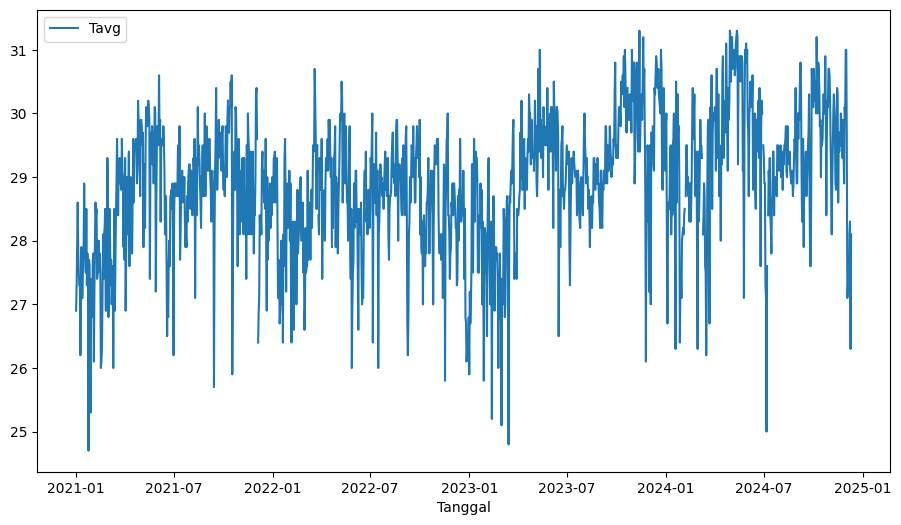

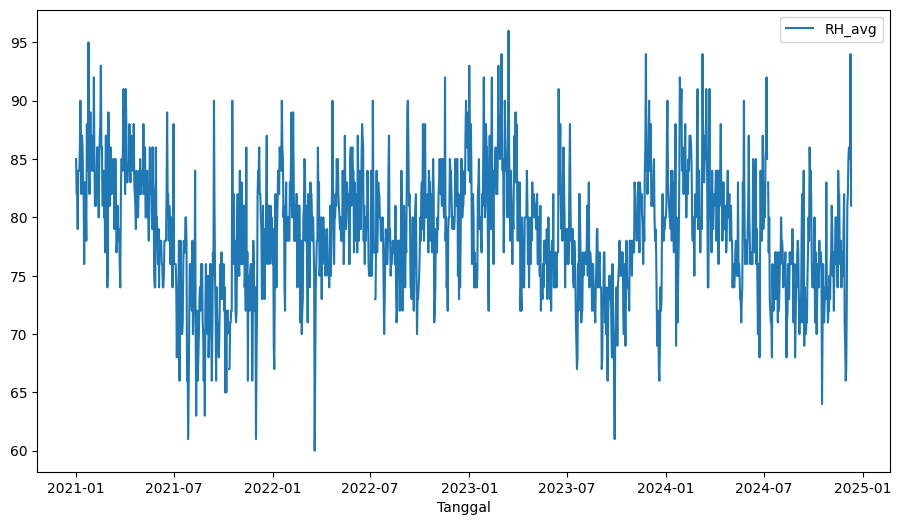

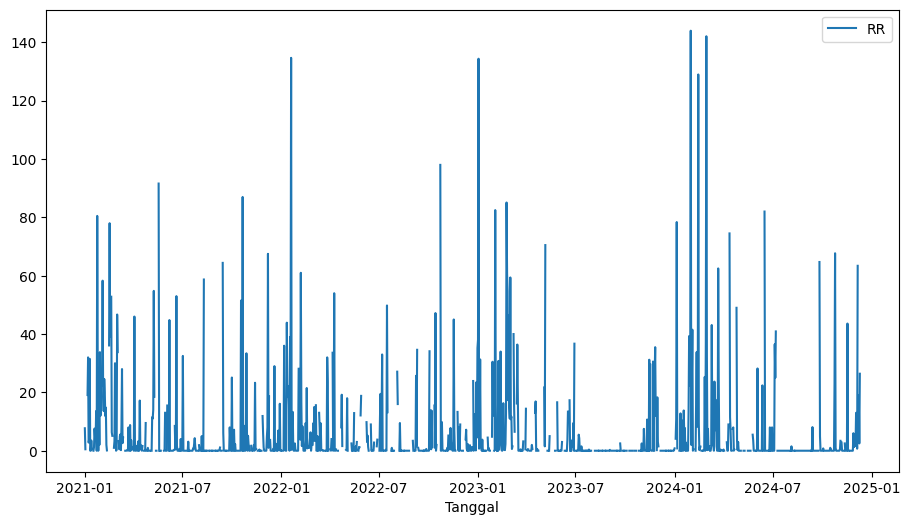

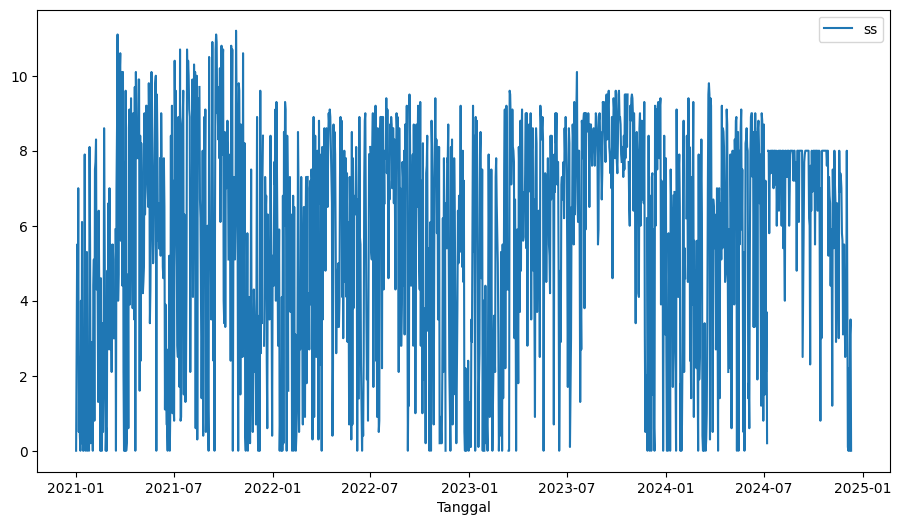

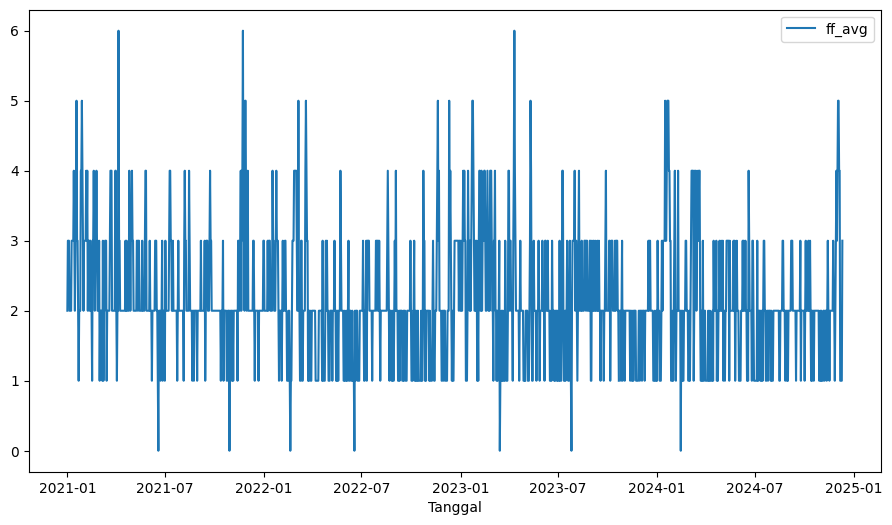

In [703]:
cuaca_tanjung_priok_processed.plot(y='Tavg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

cuaca_tanjung_priok_processed.plot(y='RH_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

cuaca_tanjung_priok_processed.plot(y='RR', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

cuaca_tanjung_priok_processed.plot(y='ss', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

cuaca_tanjung_priok_processed.plot(y='ff_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

TRENDS
- Tavg has uptrend
- RH_avg in Tanjung Priok is more sideway (no trend)

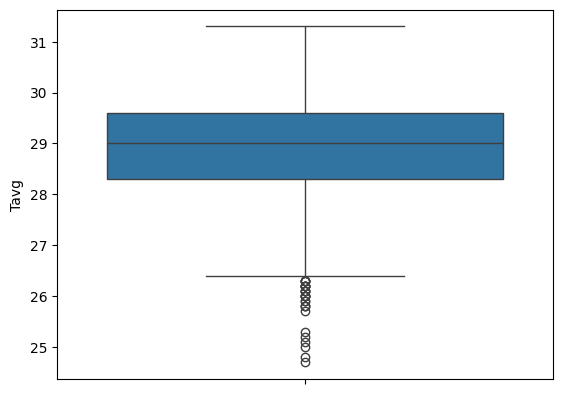

In [704]:
sns.boxplot(y=cuaca_tanjung_priok_processed['Tavg'])
plt.show()

Text(0, 0.5, 'counts')

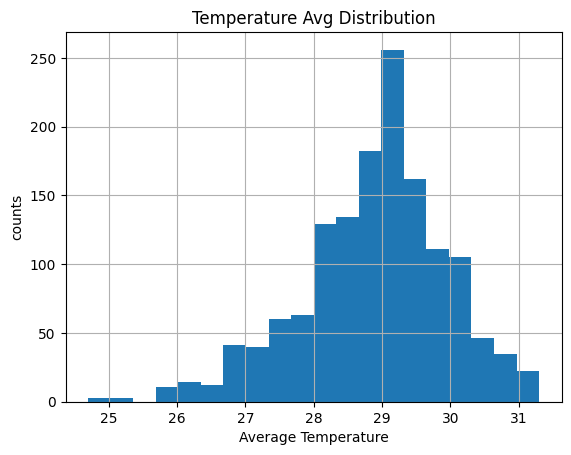

In [705]:
cuaca_tanjung_priok_processed['Tavg'].hist(bins = 20)
plt.title('Temperature Avg Distribution')
plt.xlabel('Average Temperature')
plt.ylabel('counts')

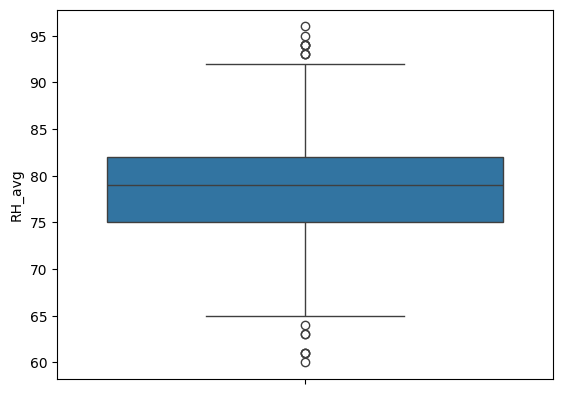

In [706]:
sns.boxplot(y=cuaca_tanjung_priok_processed['RH_avg'])
plt.show()

Text(0, 0.5, 'count')

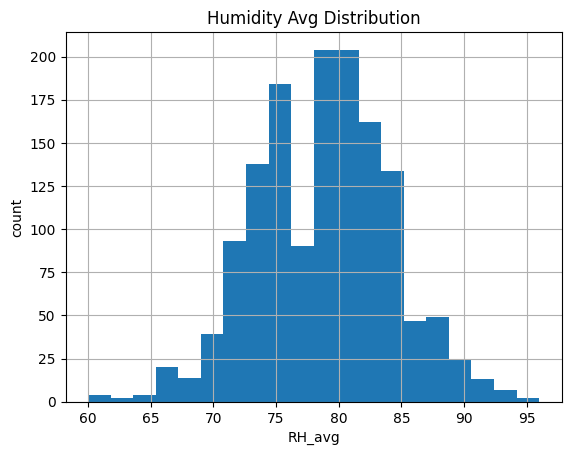

In [707]:
cuaca_tanjung_priok_processed['RH_avg'].hist(bins = 20)
plt.title('Humidity Avg Distribution')
plt.xlabel('RH_avg')
plt.ylabel('count')

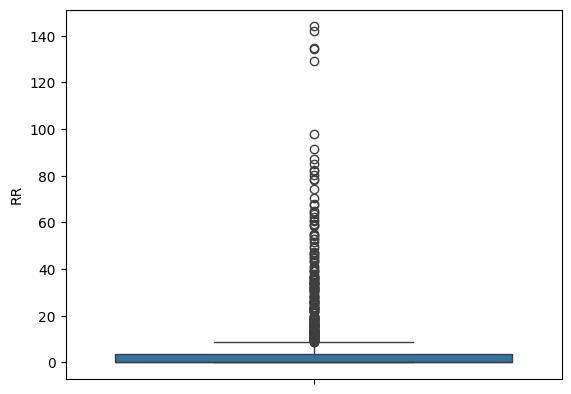

In [708]:
sns.boxplot(y=cuaca_tanjung_priok_processed['RR'])
plt.show()

Text(0, 0.5, 'count')

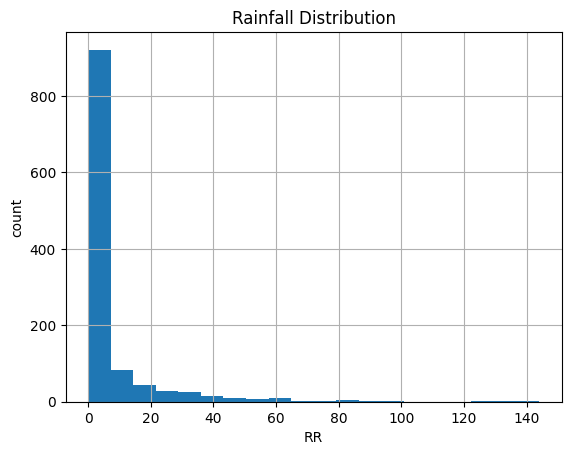

In [709]:
cuaca_tanjung_priok_processed['RR'].hist(bins = 20)
plt.title('Rainfall Distribution')
plt.xlabel('RR')
plt.ylabel('count')

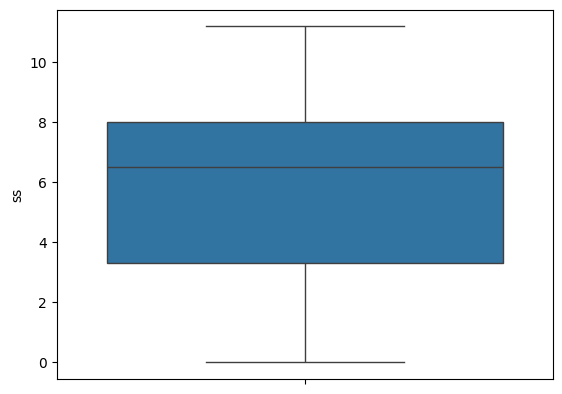

In [710]:
sns.boxplot(y=cuaca_tanjung_priok_processed['ss'])
plt.show()

Text(0, 0.5, 'count')

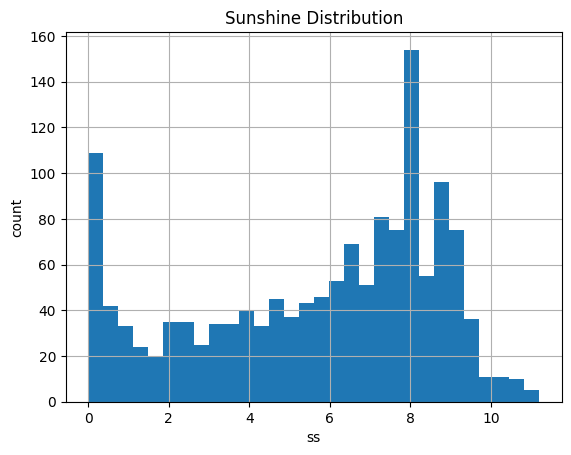

In [711]:
cuaca_tanjung_priok_processed['ss'].hist(bins = 30)
plt.title('Sunshine Distribution')
plt.xlabel('ss')
plt.ylabel('count')

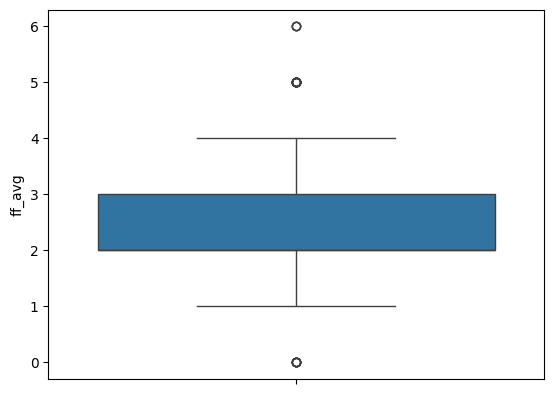

In [712]:
sns.boxplot(y=cuaca_tanjung_priok_processed['ff_avg'])
plt.show()

Text(0, 0.5, 'count')

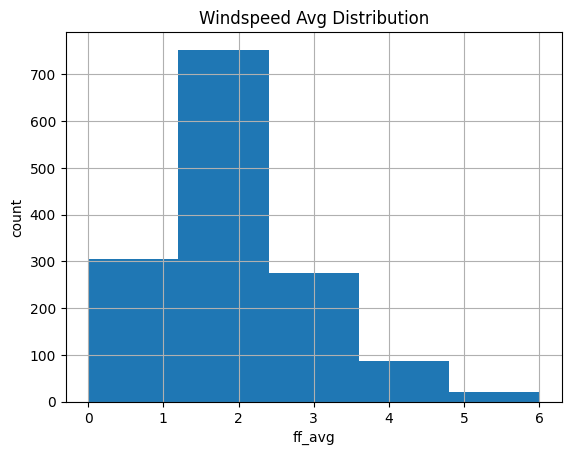

In [713]:
cuaca_tanjung_priok_processed['ff_avg'].hist(bins = 5)
plt.title('Windspeed Avg Distribution')
plt.xlabel('ff_avg')
plt.ylabel('count')

DISTRIBUTIONS
- Tavg menyerupai normal distribution namun lebih right skew dari Kemayoran
- RH_avg hampir menyerupai normal distribution
- sunshine lebih memiliki bentuk namun tetap tidak menyerupai normal distribution

#### EDA Bivariate

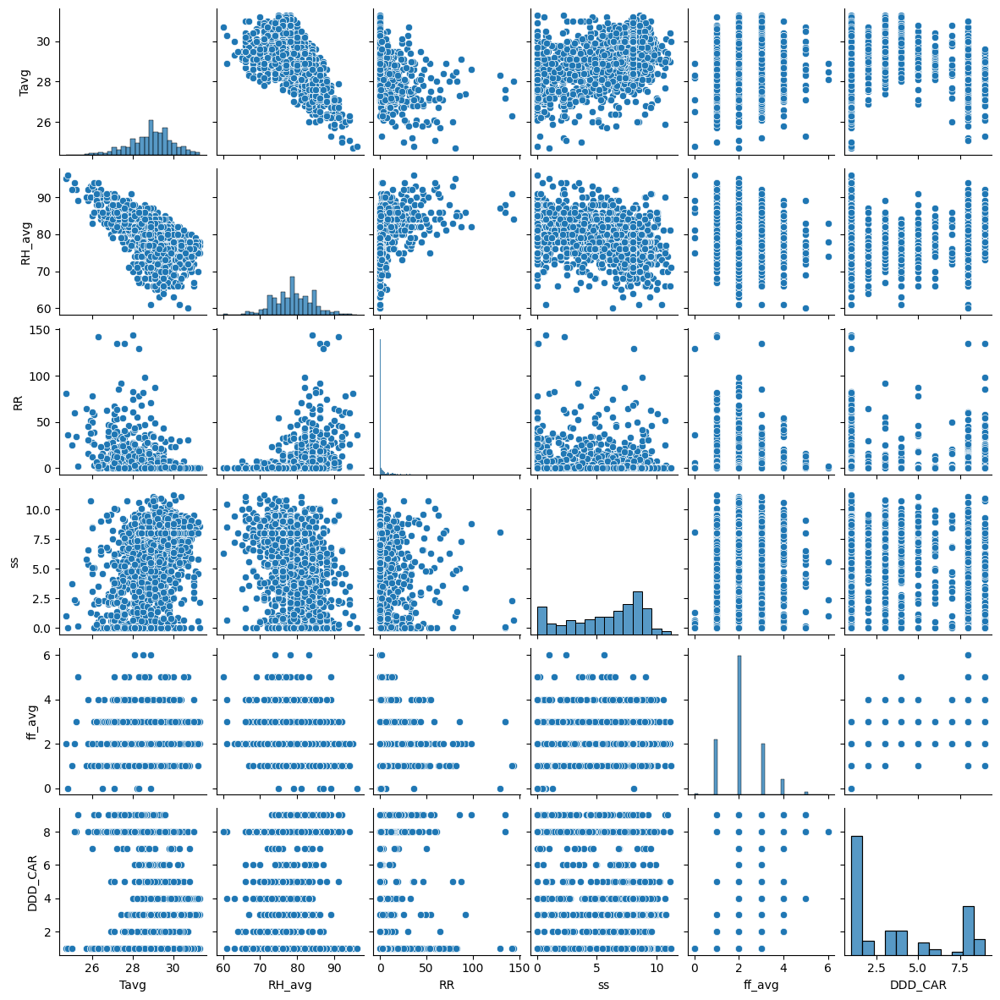

In [714]:
sns.pairplot(cuaca_tanjung_priok_processed, height=2)

Temperature wise
- LOWER Temperature - HIGHER Humidity
- no trend in Temperature & Rainfall
- no trend in Temperature & Sunshine

Humidity wise
- HIGHER Humidity - cenderung HIGHER Rainfall
- ada sedikir kecenderungan LOWER RH_avg membuat HIGHER Sunshine

Else is hard to see the correlation

#### Impute Data

In [715]:
cuaca_tanjung_priok_processed

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
Tanggal,,,,,,
2021-01-01,26.9,85.0,7.7,0.0,2.0,8.0
2021-01-02,27.3,82.0,0.5,2.9,3.0,9.0
2021-01-03,28.0,82.0,NaN,5.5,3.0,8.0
2021-01-04,28.6,79.0,2.8,2.5,3.0,8.0
2021-01-05,27.8,84.0,NaN,7.0,2.0,8.0
...,...,...,...,...,...,...
2024-12-06,27.2,86.0,63.4,2.2,1.0,1.0
2024-12-07,28.1,85.0,NaN,0.0,1.0,1.0
2024-12-08,28.3,86.0,19.0,3.1,1.0,1.0


In [716]:
# KNN
imputer = KNNImputer()
imputed_cuaca_tanjung_priok = pd.concat(
  [
    pd.DataFrame({
      'Tanggal': cuaca_tanjung_priok['Tanggal']
    }),
    pd.DataFrame(imputer.fit_transform(cuaca_tanjung_priok_processed),columns = ['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR'])
  ], axis=1
)

In [717]:
imputed_cuaca_tanjung_priok[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = imputed_cuaca_tanjung_priok[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].round(1)
imputed_cuaca_tanjung_priok[['RH_avg', 'DDD_CAR']] = imputed_cuaca_tanjung_priok[['RH_avg', 'DDD_CAR']].round(0)

In [718]:
imputed_cuaca_tanjung_priok

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2021-01-01,26.9,85.0,7.7,0.0,2.0,8.0
1,2021-01-02,27.3,82.0,0.5,2.9,3.0,9.0
2,2021-01-03,28.0,82.0,8.4,5.5,3.0,8.0
3,2021-01-04,28.6,79.0,2.8,2.5,3.0,8.0
4,2021-01-05,27.8,84.0,8.1,7.0,2.0,8.0
...,...,...,...,...,...,...,...
1435,2024-12-06,27.2,86.0,63.4,2.2,1.0,1.0
1436,2024-12-07,28.1,85.0,13.1,0.0,1.0,1.0
1437,2024-12-08,28.3,86.0,19.0,3.1,1.0,1.0
1438,2024-12-09,26.3,94.0,2.5,3.5,1.0,1.0


In [719]:
# Interpolation in 23 October 2023
pysqldf("""select * from imputed_cuaca_tanjung_priok where Tanggal in ('2023-10-21', '2023-10-22', '2023-10-23', '2023-10-24', '2023-10-25')""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-21,30.0,75.0,0.0,8.1,2.0,3.0
1,2023-10-22,30.4,74.0,0.0,9.5,1.0,1.0
2,2023-10-23,28.9,79.0,6.3,5.7,2.1,4.0
3,2023-10-24,29.9,74.0,0.0,7.7,2.0,4.0
4,2023-10-25,30.2,72.0,0.0,6.5,2.0,5.0


In [720]:
# Linear Interpolation
imputed_cuaca_tanjung_priok.loc[imputed_cuaca_tanjung_priok['Tanggal'] == datetime.strptime('23-10-2023', '%d-%m-%Y').date(), ['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = np.nan
imputed_cuaca_tanjung_priok[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = imputed_cuaca_tanjung_priok[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].interpolate(method ='linear', limit_direction ='forward')

In [721]:
# Interpolation in 23 October 2023
pysqldf("""select * from imputed_cuaca_tanjung_priok where Tanggal in ('2023-10-20', '2023-10-21', '2023-10-22', '2023-10-23', '2023-10-24', '2023-10-25', '2023-10-26')""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-20,29.70,78.0,0.0,8.9,2.0,1.0
1,2023-10-21,30.00,75.0,0.0,8.1,2.0,3.0
2,2023-10-22,30.40,74.0,0.0,9.5,1.0,1.0
3,2023-10-23,30.15,74.0,0.0,8.6,1.5,2.5
4,2023-10-24,29.90,74.0,0.0,7.7,2.0,4.0
5,2023-10-25,30.20,72.0,0.0,6.5,2.0,5.0
6,2023-10-26,30.30,78.0,0.0,6.0,1.0,1.0


#### EDA After Cleaning & Preprocess

In [722]:
imputed_cuaca_tanjung_priok.describe()

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
count,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000
mean,28.883646,78.720139,5.966250,5.664028,2.137292,3.607986
std,1.064644,5.361836,14.659092,2.989683,0.881730,2.960002
min,24.700000,60.000000,0.000000,0.000000,0.000000,1.000000
25%,28.300000,75.000000,0.000000,3.400000,2.000000,1.000000
50%,29.000000,79.000000,0.000000,6.500000,2.000000,3.000000
75%,29.600000,82.000000,4.800000,8.000000,3.000000,7.000000
max,31.300000,96.000000,144.000000,11.200000,6.000000,9.000000


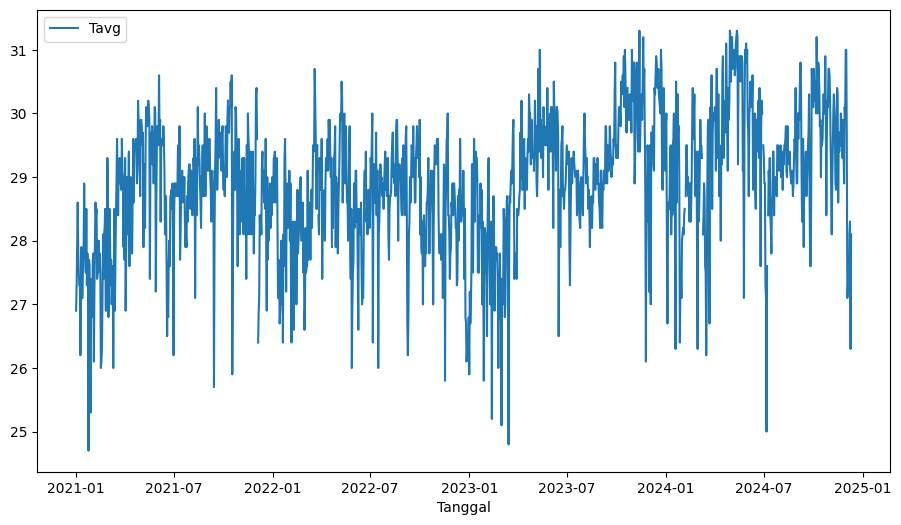

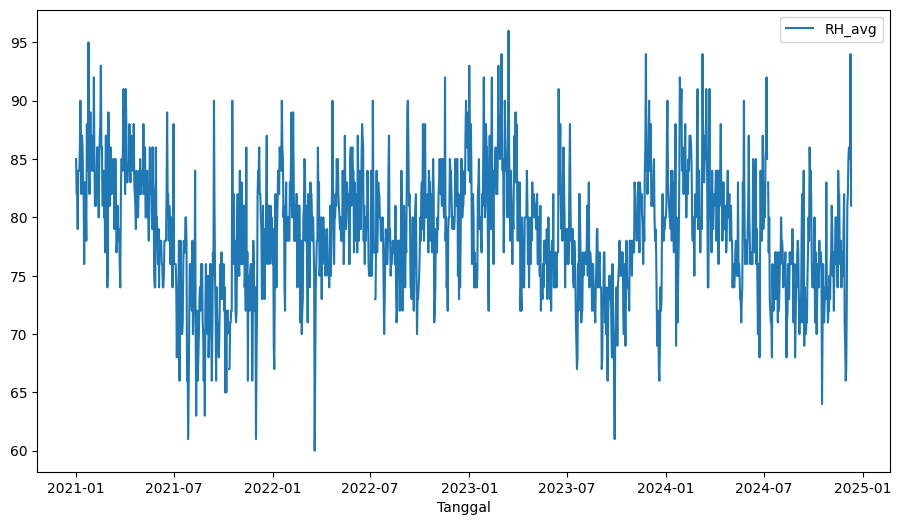

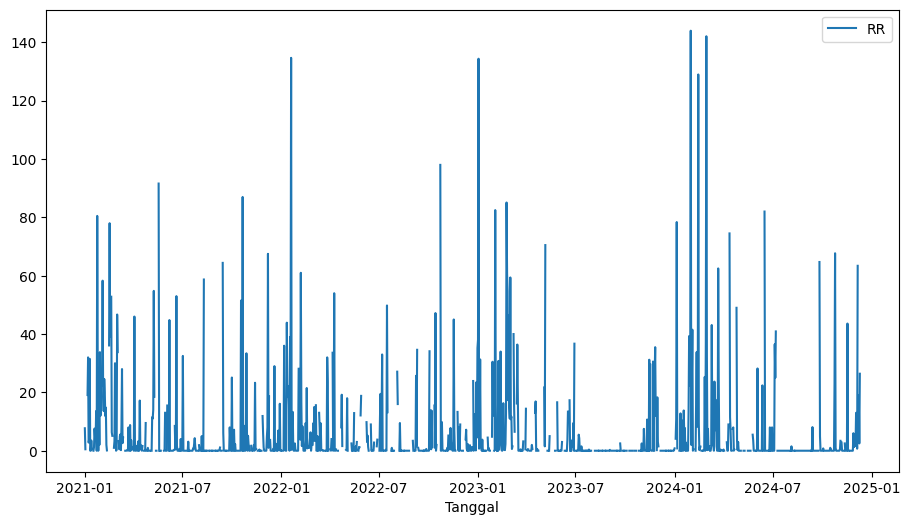

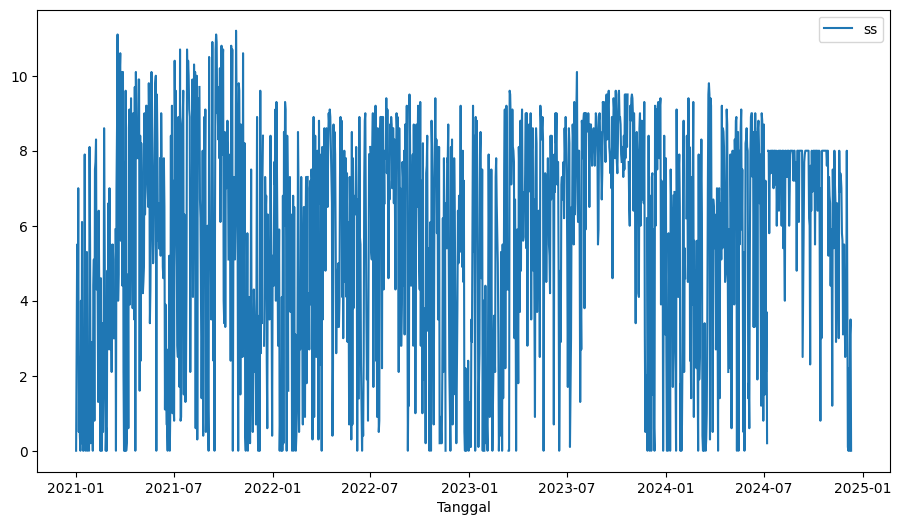

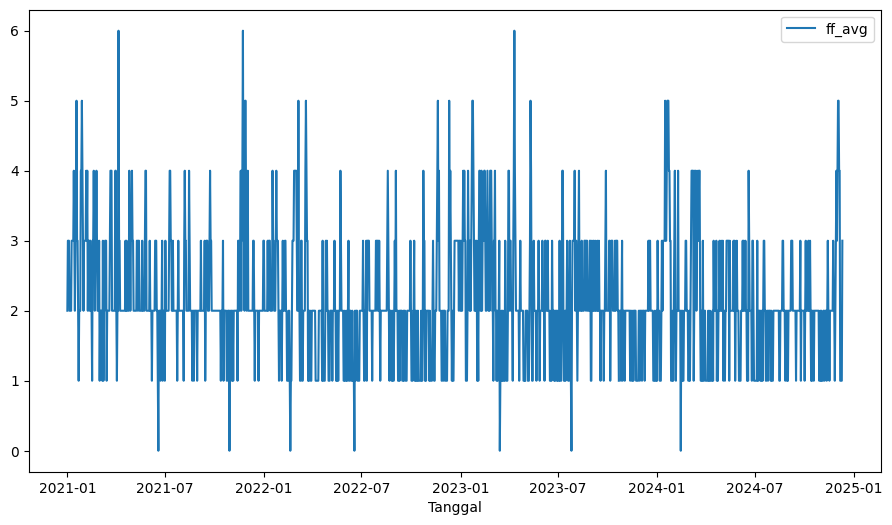

In [723]:
cuaca_tanjung_priok_processed.plot(y='Tavg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

cuaca_tanjung_priok_processed.plot(y='RH_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

cuaca_tanjung_priok_processed.plot(y='RR', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

cuaca_tanjung_priok_processed.plot(y='ss', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

cuaca_tanjung_priok_processed.plot(y='ff_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

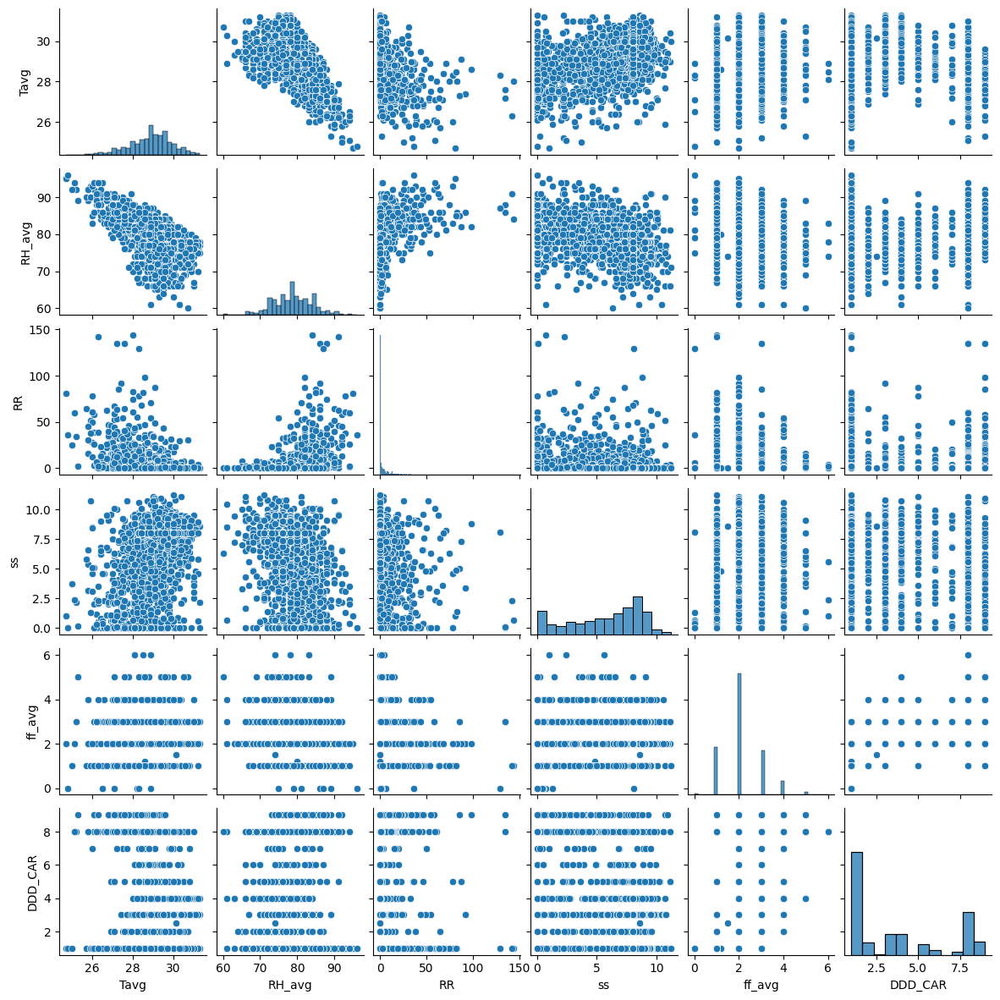

In [724]:
sns.pairplot(imputed_cuaca_tanjung_priok, height=2)

perubahan paling signifikan hanya dialami Rainfall, karena jumlah nullnya paling banyak (see .describe()). namun tetap tidak ada perubahan tren yang bermakna

### Summary EDA Data Cuaca

In [725]:
pysqldf(""" select 
        'Tanjung Priok' as Stasiun,
        count(*) as "Rows contain null"
        from cuaca_tanjung_priok 
        where Tavg is null or Tavg = '9999' or Tavg = '8888'
        or RH_avg is null or RH_avg = '9999' or RH_avg = '8888'
        or RR is null or RR = '9999' or RR = '8888'
        or ss is null or ss = '9999' or ss = '8888'
        or ff_avg is null or ff_avg = '9999' or ff_avg = '8888'
        UNION
        select 
        'Kemayoran' as Stasiun,
        count(*) 
        from cuaca_kemayoran
        where Tavg is null or Tavg = '9999' or Tavg = '8888'
        or RH_avg is null or RH_avg = '9999' or RH_avg = '8888'
        or RR is null or RR = '9999' or RR = '8888'
        or ss is null or ss = '9999' or ss = '8888'
        or ff_avg is null or ff_avg = '9999' or ff_avg = '8888'
""")

,Stasiun,Rows contain null
0,Kemayoran,434
1,Tanjung Priok,305


**TRENDS**

*Kemayoran*:
- Tavg semakin naik
- RH_avg cenderung semakin turun

*Tanjung Priok*:
- Tavg semakin naik
- RH_avg no trend

**DISTRIBUTIONS**

*Kemayoran*:
- Tavg & RH_avg mempunyai bentuk distribusi normal yang sedikit right skew

*Tanjung Priok*:
- Tavg menyerupai normal distribution namun lebih right skew dari Kemayoran
- RH_avg hampir menyerupai normal distribution
- sunshine lebih memiliki bentuk namun tetap tidak menyerupai normal distribution

**CORRELATIONS**

*Kemayoran*
1. Temperature
    - HIGHER Humidity - LOWER Temperature
    - HIGHER Rainfall - cenderung LOWER Temperature
    - HIGHER Sunshine - cendurung HIGHER Temperature
2. Humidity
    - HIGHER Rainfall - cenderung HIGHER Humidity
    - LOWER sunshine - cenderung HIGHER Humidity

*Tanjung Priok*
1. Temperature
    - LOWER Temperature - HIGHER Humidity
    - no trend in Temperature & Rainfall
    - no trend in Temperature & Sunshine
2. Humidity
    - HIGHER Humidity - cenderung HIGHER Rainfall
    - ada sedikir kecenderungan LOWER RH_avg membuat HIGHER Sunshine


**Missing Value Summary (Kemayoran & Tanjung Priok)**

**Kemayoran**
- total row: 1440
- rows contain null: 434
- 30.14% data null

List of Missing Values:
  - Tavg: 8888, blank
  - RH_avg: blank
  - RR: 8888, blank
  - ss: blank
  - ff_avg: blank
  - ddd_car: blank

**Tanjung Priok**
- total row: 1440
- rows contain null: 305
- 21.18% data null

List of Missing Values:
- Tavg: blank
- RH_avg: blank
- RR: 8888, blank
- ss: blank
- ff_avg: blank
- ddd_car: blank 

After Cleaning & Preprocessing

Tanjung Priok: Rainfall menjadi kolom dengan jumlah imputasi paling banyak (300) data, namun tetap tidak terlihat perubahan yang berarti

## Data Polutan

### Penyamaan Kolom

#### Polutan 1 (tahun 2021)

In [726]:
polutan_1 = polutan_1.rename(columns={'categori': 'kategori'})

In [727]:
polutan_1

,periode_data,tanggal,stasiun,pm10,pm25,so2,co,o3,no2,max,critical,kategori
0,202101,22/01/2021,DKI5,45,NaN,21,13,40,15,45,PM10,BAIK
1,202101,23/01/2021,DKI5,80,NaN,22,44,44,22,80,PM10,SEDANG
2,202101,24/01/2021,DKI5,27,NaN,14,9,29,---,29,CO,BAIK
3,202101,25/01/2021,DKI5,55,NaN,19,29,67,13,67,CO,SEDANG
4,202101,26/01/2021,DKI5,57,NaN,21,23,36,16,57,PM10,SEDANG
...,...,...,...,...,...,...,...,...,...,...,...,...
1820,202112,30/12/2021,DKI2,47,64,38,13,38,35,64,PM25,SEDANG
1821,202112,31/12/2021,DKI2,61,85,33,23,37,44,85,PM25,SEDANG
1822,202112,01/12/2021,DKI3,53,70,43,12,32,15,70,PM25,SEDANG
1823,202112,02/12/2021,DKI3,35,55,42,7,29,9,55,PM25,SEDANG


#### Polutan 2 (tahun 2022)

In [728]:
polutan_2 = polutan_2.rename(columns={
  'pm_duakomalima': 'pm25',
  'categori': 'kategori'
})

In [729]:
polutan_2

,periode_data,tanggal,stasiun,pm_10,pm25,so2,co,o3,no2,max,critical,kategori
0,202201,01/01/2022,DKI4,57,85,48,13,34,18,85,"PM2,5",SEDANG
1,202201,02/01/2022,DKI4,40,70,45,10,36,11,70,"PM2,5",SEDANG
2,202201,03/01/2022,DKI4,49,80,49,13,37,21,80,"PM2,5",SEDANG
3,202201,04/01/2022,DKI4,59,102,51,14,51,26,102,"PM2,5",TIDAK SEHAT
4,202201,05/01/2022,DKI4,95,165,53,18,55,32,165,"PM2,5",TIDAK SEHAT
...,...,...,...,...,...,...,...,...,...,...,...,...
360,202212,27/12/2022,DKI2,36,47,58,42,20,18,58,SO2,SEDANG
361,202212,28/12/2022,DKI3,46,66,57,41,15,19,66,"PM2,5",SEDANG
362,202212,29/12/2022,DKI2,23,50,57,12,16,15,57,SO2,SEDANG
363,202212,30/12/2022,DKI4,40,64,57,21,17,24,64,"PM2,5",SEDANG


#### Polutan 3 (tahun 2023)

In [730]:
polutan_3 = polutan_3.rename(columns={
  'pm_sepuluh': 'pm10',
  'pm_duakomalima': 'pm25',
  'sulfur_dioksida': 'so2',
  'karbon_monoksida': 'co',
  'ozon': 'o3',
  'nitrogen_dioksida': 'no2'
})

In [731]:
polutan_3

,periode_data,tanggal,stasiun,pm10,pm25,so2,co,o3,no2,max,critical,kategori
0,202301,01/01/2023,DKI1,44,55,47,10,24,9,55,PM25,SEDANG
1,202301,01/01/2023,DKI2,44,61,56,16,20,19,61,PM25,SEDANG
2,202301,01/01/2023,DKI3,26,43,51,5,16,2,51,SO2,SEDANG
3,202301,01/01/2023,DKI4,23,57,-,-,-,-,57,PM25,SEDANG
4,202301,01/01/2023,DKI5,30,-,21,13,14,1,52,PM10,SEDANG
...,...,...,...,...,...,...,...,...,...,...,...,...
1820,202312,31/12/2023,DKI1,54,68,49,11,19,12,68,PM25,SEDANG
1821,202312,31/12/2023,DKI2,47,58,56,21,23,24,58,PM25,SEDANG
1822,202312,31/12/2023,DKI3,48,49,-,24,14,-,49,PM25,BAIK
1823,202312,31/12/2023,DKI4,49,73,-,-,-,-,73,PM25,SEDANG


#### Polutan 4 (tahun 2024)

In [732]:
polutan_4 = polutan_4.rename(columns={
  'pm_sepuluh': 'pm10',
  'pm_duakomalima': 'pm25',
  'sulfur_dioksida': 'so2',
  'karbon_monoksida': 'co',
  'ozon': 'o3',
  'nitrogen_dioksida': 'no2'
})

In [733]:
polutan_4['tanggal_2'] = polutan_4['tanggal'].astype('str') + '/' + polutan_4['bulan'].astype('str') + '/' + '2024'

In [734]:
polutan_4.insert(1, 'tanggal_3', polutan_4['tanggal_2'])

In [735]:
polutan_4.pop('bulan')
polutan_4.pop('tanggal')
polutan_4.pop('tanggal_2')

0        21/1/2024
1        22/1/2024
2        23/1/2024
3        24/1/2024
4        25/1/2024
           ...    
1520    10/10/2024
1521    11/10/2024
1522    12/10/2024
1523    13/10/2024
1524    14/10/2024
Name: tanggal_2, Length: 1525, dtype: object

In [736]:
polutan_4 = polutan_4.rename(columns=({'tanggal_3': 'tanggal'}))

In [737]:
polutan_4

,periode_data,tanggal,stasiun,pm10,pm25,so2,co,o3,no2,max,critical,kategori
0,202401,21/1/2024,DKI3,51.0,65.0,45.0,9.0,8.0,79.0,79.0,NaN,SEDANG
1,202401,22/1/2024,DKI3,27.0,34.0,45.0,5.0,8.0,56.0,56.0,NaN,SEDANG
2,202401,23/1/2024,DKI3,NaN,52.0,46.0,6.0,9.0,51.0,52.0,PM25,SEDANG
3,202401,24/1/2024,DKI3,46.0,65.0,46.0,8.0,9.0,38.0,65.0,PM25,SEDANG
4,202401,25/1/2024,DKI3,37.0,55.0,47.0,7.0,11.0,28.0,55.0,PM25,SEDANG
...,...,...,...,...,...,...,...,...,...,...,...,...
1520,202410,10/10/2024,DKI4,58.0,62.0,53.0,20.0,41.0,20.0,62.0,PM25,SEDANG
1521,202410,11/10/2024,DKI4,64.0,66.0,53.0,23.0,34.0,26.0,66.0,PM25,SEDANG
1522,202410,12/10/2024,DKI4,58.0,64.0,54.0,21.0,33.0,25.0,64.0,PM25,SEDANG
1523,202410,13/10/2024,DKI4,59.0,60.0,53.0,21.0,36.0,20.0,60.0,PM25,SEDANG


### Penggabungan Data 2021-2024

In [738]:
merge_polutan = pd.concat([polutan_1, polutan_3, polutan_4], ignore_index=True,axis=0)

In [739]:
merge_polutan.pop('periode_data')
merge_polutan.pop('max')
merge_polutan.pop('critical')
merge_polutan.pop('kategori')

0         BAIK
1       SEDANG
2         BAIK
3       SEDANG
4       SEDANG
         ...  
5170    SEDANG
5171    SEDANG
5172    SEDANG
5173    SEDANG
5174    SEDANG
Name: kategori, Length: 5175, dtype: object

In [740]:
merge_polutan

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,22/01/2021,DKI5,45,NaN,21,13,40,15
1,23/01/2021,DKI5,80,NaN,22,44,44,22
2,24/01/2021,DKI5,27,NaN,14,9,29,---
3,25/01/2021,DKI5,55,NaN,19,29,67,13
4,26/01/2021,DKI5,57,NaN,21,23,36,16
...,...,...,...,...,...,...,...,...
5170,10/10/2024,DKI4,58.0,62.0,53.0,20.0,41.0,20.0
5171,11/10/2024,DKI4,64.0,66.0,53.0,23.0,34.0,26.0
5172,12/10/2024,DKI4,58.0,64.0,54.0,21.0,33.0,25.0
5173,13/10/2024,DKI4,59.0,60.0,53.0,21.0,36.0,20.0


### Data Understanding

- Check data after merged
- find the Non-NaN empty values
- formatting data

In [741]:
merge_polutan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5175 entries, 0 to 5174
Data columns (total 8 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   tanggal  5175 non-null   object
 1   stasiun  5175 non-null   object
 2   pm10     5146 non-null   object
 3   pm25     5102 non-null   object
 4   so2      5168 non-null   object
 5   co       5164 non-null   object
 6   o3       5168 non-null   object
 7   no2      5156 non-null   object
dtypes: object(8)
memory usage: 323.6+ KB


In [742]:
merge_polutan.describe()

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
count,5175,5175,5146,5102,5168,5164,5168,5156
unique,1035,5,175,263,137,93,163,145
top,14/10/2024,DKI5,-,-,53,10,24,15
freq,5,1035,222,295,141,337,148,183


In [743]:
merge_polutan['tanggal'] = pd.to_datetime(merge_polutan['tanggal'], format = '%d/%m/%Y')

In [744]:
merge_polutan = merge_polutan.sort_values(by='tanggal', ignore_index=True)

#### PM10

In [745]:
# Checking Non-NaN empty values
pm10_uv = pysqldf(""" select distinct pm10 from merge_polutan where pm10 not like '%.0' """)

pm10_uv[~pm10_uv['pm10'].astype(str).str.isnumeric()]

# THERE IS None TOO

,pm10
32,---
83,-


#### PM2.5

In [746]:
# Checking Non-NaN empty values

# pysqldf(""" select distinct pm25 from merge_polutan where pm25 like '%.%' order by pm25 """)['pm25'].values
pm25_uv = pysqldf(""" select distinct pm25 from merge_polutan where pm25 not like '%.0' order by pm25""") # not float
pm25_uv[~pm25_uv['pm25'].astype(str).str.isnumeric()]

# THERE IS None TOO

,pm25
0,-
1,---


#### SO2

In [747]:
# Checking Non-NaN empty values

# pysqldf(""" select distinct so2 from merge_polutan where so2 like '%.%' order by so2 """)['so2'].values
so2_uv = pysqldf(""" select distinct so2 from merge_polutan where so2 not like '%.0' order by so2""") # not float
so2_uv[~so2_uv['so2'].astype(str).str.isnumeric()]

# THERE IS None TOO

,so2
0,-
1,---


#### CO

In [748]:
# Checking Non-NaN empty values

# pysqldf(""" select distinct co from merge_polutan where co like '%.%' order by co """)['co'].values
co_uv = pysqldf(""" select distinct co from merge_polutan where co not like '%.0' order by co""") # not float
co_uv[~co_uv['co'].astype(str).str.isnumeric()]

# THERE IS None TOO

,co
0,-
1,---


#### O3

In [749]:
# Checking Non-NaN empty values

# pysqldf(""" select distinct o3 from merge_polutan where o3 like '%.%' order by o3 """)['o3'].values
o3_uv = pysqldf(""" select distinct o3 from merge_polutan where o3 not like '%.0' order by o3""") # not float
o3_uv[~o3_uv['o3'].astype(str).str.isnumeric()]

# THERE IS None TOO

,o3
0,-
1,---


In [750]:
# Checking Non-NaN empty values

# pysqldf(""" select distinct no2 from merge_polutan where no2 like '%.%' order by no2 """)['no2'].values
no2_uv = pysqldf(""" select distinct no2 from merge_polutan where no2 not like '%.0' order by no2""") # not float
no2_uv[~no2_uv['no2'].astype(str).str.isnumeric()]

# THERE IS None TOO

,no2
0,-
1,---


### Check Missing Values Pada Penggabungan Data 2021-2024

1. pm10: '-', '---', blank
2. pm25: '-', '---', blank
3. so2: '-', '---', blank
4. co: '-', '---', blank
5. o3: '-', '---', blank
6. no2: '-', '---', blank

missing values akan diubah ke dalamn NaN

In [751]:
merge_polutan = merge_polutan.replace(['-', '---'], np.nan)

In [752]:
for col in ['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']:
  merge_polutan[col] = merge_polutan[col].astype(float)

In [753]:
merge_polutan

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2021-01-01,DKI2,38.0,58.0,2.0,11.0,65.0,6.0
1,2021-01-01,DKI4,41.0,NaN,37.0,14.0,35.0,4.0
2,2021-01-01,DKI3,43.0,56.0,15.0,10.0,33.0,5.0
3,2021-01-01,DKI1,38.0,53.0,29.0,6.0,31.0,13.0
4,2021-01-01,DKI5,37.0,NaN,20.0,12.0,25.0,4.0
...,...,...,...,...,...,...,...,...
5170,2024-10-31,DKI1,59.0,78.0,11.0,28.0,29.0,45.0
5171,2024-10-31,DKI5,55.0,89.0,41.0,20.0,52.0,15.0
5172,2024-10-31,DKI4,62.0,59.0,53.0,24.0,41.0,27.0
5173,2024-10-31,DKI2,65.0,80.0,59.0,13.0,28.0,26.0


In [754]:
# data yang mengandung null values
null_merge_polutan = merge_polutan[merge_polutan.isnull().any(axis=1)]
null_merge_polutan

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
1,2021-01-01,DKI4,41.0,NaN,37.0,14.0,35.0,4.0
4,2021-01-01,DKI5,37.0,NaN,20.0,12.0,25.0,4.0
5,2021-01-02,DKI4,44.0,NaN,38.0,38.0,59.0,3.0
8,2021-01-02,DKI5,33.0,NaN,18.0,20.0,64.0,6.0
9,2021-01-02,DKI2,29.0,46.0,NaN,12.0,80.0,12.0
...,...,...,...,...,...,...,...,...
4922,2024-09-11,DKI3,34.0,NaN,60.0,8.0,20.0,44.0
4951,2024-09-17,DKI4,63.0,67.0,53.0,21.0,47.0,NaN
5010,2024-09-29,DKI5,29.0,95.0,36.0,22.0,40.0,NaN
5029,2024-10-02,DKI4,67.0,NaN,54.0,22.0,40.0,22.0


In [755]:
count_null_merge_polutan = pysqldf(
"""
  select 
    stasiun, 
    sum(case when pm10 is null then 1 else 0 end) as pm10,
    sum(case when pm25 is null then 1 else 0 end) as pm25,
    sum(case when so2 is null then 1 else 0 end) as so2,
    sum(case when co is null then 1 else 0 end) as co,
    sum(case when o3 is null then 1 else 0 end) as o3,
    sum(case when no2 is null then 1 else 0 end) as no2
  from null_merge_polutan
  group by stasiun
"""
)
count_null_merge_polutan

,stasiun,pm10,pm25,so2,co,o3,no2
0,DKI1,4,6,9,17,4,4
1,DKI2,21,20,29,13,9,15
2,DKI3,32,21,11,8,44,28
3,DKI4,223,56,28,42,37,26
4,DKI5,39,303,83,11,10,47


<Axes: xlabel='stasiun'>

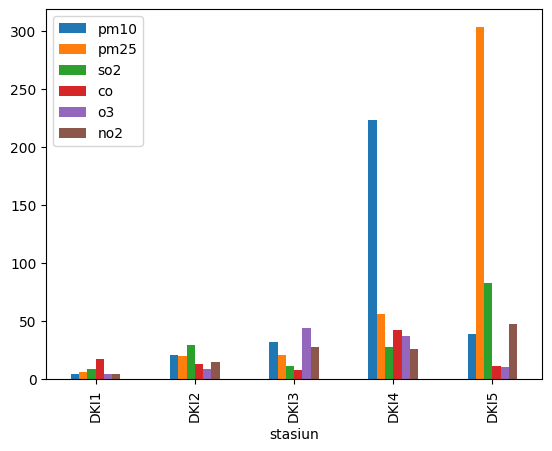

In [756]:
# see null count of every observed pollutant by each region
count_null_merge_polutan.plot(
  x='stasiun',
  kind='bar',
  stacked=False
)

current total data: 5175
total rows with missing data: 906

17.55% baris data contains missing value

42 baris data Missing Completely At Random (MCAR)

In [757]:
# data polutan yang semua perhitungan kosong
null_rows = pysqldf(""" 
  select *
  from null_merge_polutan 
  where 
  pm10 is null and
  pm25 is null and
  so2 is null and
  co is null and
  o3 is null and
  no2 is null
""")
null_rows

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2021-01-24 00:00:00.000000,DKI4,None,None,None,None,None,None
1,2021-01-25 00:00:00.000000,DKI4,None,None,None,None,None,None
2,2021-02-01 00:00:00.000000,DKI4,None,None,None,None,None,None
3,2021-02-24 00:00:00.000000,DKI3,None,None,None,None,None,None
4,2021-03-04 00:00:00.000000,DKI5,None,None,None,None,None,None
5,2021-04-17 00:00:00.000000,DKI2,None,None,None,None,None,None
6,2021-04-18 00:00:00.000000,DKI2,None,None,None,None,None,None
7,2021-07-12 00:00:00.000000,DKI4,None,None,None,None,None,None
8,2021-09-19 00:00:00.000000,DKI4,None,None,None,None,None,None
9,2021-09-20 00:00:00.000000,DKI4,None,None,None,None,None,None


In [758]:
# melihat count baris kosong
null_row_plot = pysqldf(""" 
  select strftime('%Y', tanggal) as year,
    SUM(CASE WHEN stasiun = 'DKI1' THEN 1 ELSE 0 END) AS DKI1,
    SUM(CASE WHEN stasiun = 'DKI2' THEN 1 ELSE 0 END) AS DKI2,
    SUM(CASE WHEN stasiun = 'DKI3' THEN 1 ELSE 0 END) AS DKI3,
    SUM(CASE WHEN stasiun = 'DKI4' THEN 1 ELSE 0 END) AS DKI4,
    SUM(CASE WHEN stasiun = 'DKI5' THEN 1 ELSE 0 END) AS DKI5
  from null_merge_polutan 
  where 
  pm10 is null and
  pm25 is null and
  so2 is null and
  co is null and
  o3 is null and
  no2 is null
  group by strftime('%Y', tanggal)
  order by stasiun,
strftime('%Y', tanggal) asc
""")

null_row_plot

,year,DKI1,DKI2,DKI3,DKI4,DKI5
0,2024,0,1,0,4,0
1,2023,4,2,4,4,7
2,2021,0,3,2,10,1


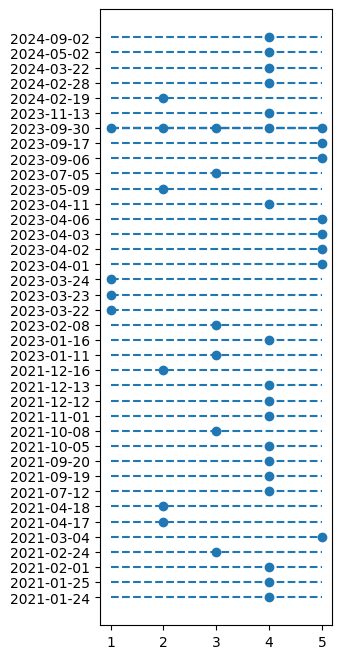

In [759]:
# melihat tanggal dari baris yg kosong

null_row_occurence = pysqldf(""" 
  select 
    substring(tanggal, 0, 11) as tanggal,
    case 
      when stasiun = 'DKI1' then 1
      when stasiun = 'DKI2' then 2
      when stasiun = 'DKI3' then 3
      when stasiun = 'DKI4' then 4
      when stasiun = 'DKI5' then 5             
    end as data
  from null_merge_polutan 
  where 
  pm10 is null and
  pm25 is null and
  so2 is null and
  co is null and
  o3 is null and
  no2 is null
  order by tanggal
""")

plt.figure(figsize=(3, 8))
plt.scatter(null_row_occurence['data'], null_row_occurence['tanggal'])
plt.hlines(y=null_row_occurence['tanggal'], xmax=5, xmin=1, linestyles='dashed')
# plt.xticks(rotation=90)

<Axes: xlabel='year'>

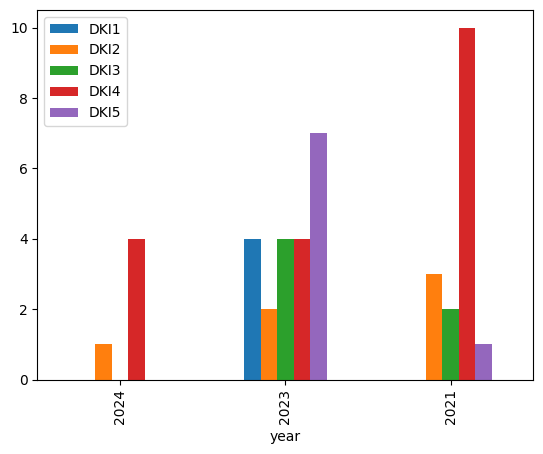

In [760]:
# see null ROW count of every observed pollutant by each region
null_row_plot.plot(
  x='year',
  kind='bar',
  stacked=False,
)

1. baris yg ga punya data samsek bisa 1 hari aja atau lebih
2. paling sering gada datanya samsek dari DKI4
3. anomali di 2023 september 30: tidak ada data pada kelima stasiun

rencana akan pake KNN or RF buat handle missing values

### Seperate Pollutant Data By stasiun

#### DKI1

In [761]:
merge_polutan_dki1 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI1'""")
merge_polutan_dki1

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2021-01-01 00:00:00.000000,DKI1,38.0,53.0,29.0,6.0,31.0,13.0
1,2021-01-02 00:00:00.000000,DKI1,27.0,46.0,27.0,7.0,47.0,7.0
2,2021-01-03 00:00:00.000000,DKI1,44.0,58.0,25.0,7.0,40.0,13.0
3,2021-01-04 00:00:00.000000,DKI1,30.0,48.0,24.0,4.0,32.0,7.0
4,2021-01-05 00:00:00.000000,DKI1,38.0,53.0,24.0,6.0,31.0,9.0
...,...,...,...,...,...,...,...,...
1030,2024-10-27 00:00:00.000000,DKI1,54.0,78.0,19.0,23.0,34.0,31.0
1031,2024-10-28 00:00:00.000000,DKI1,60.0,83.0,10.0,26.0,37.0,36.0
1032,2024-10-29 00:00:00.000000,DKI1,59.0,75.0,11.0,28.0,29.0,41.0
1033,2024-10-30 00:00:00.000000,DKI1,62.0,86.0,11.0,27.0,36.0,44.0


In [762]:
merge_polutan_dki1 = merge_polutan_dki1.rename(columns={
  'pm10': 'pm10_dki1',
  'pm25': 'pm25_dki1',
  'so2': 'so2_dki1',
  'co': 'co_dki1',
  'o3': 'o3_dki1',
  'no2': 'no2_dki1'
})
merge_polutan_dki1.pop('stasiun')

0       DKI1
1       DKI1
2       DKI1
3       DKI1
4       DKI1
        ... 
1030    DKI1
1031    DKI1
1032    DKI1
1033    DKI1
1034    DKI1
Name: stasiun, Length: 1035, dtype: object

In [763]:
merge_polutan_dki1

,tanggal,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1
0,2021-01-01 00:00:00.000000,38.0,53.0,29.0,6.0,31.0,13.0
1,2021-01-02 00:00:00.000000,27.0,46.0,27.0,7.0,47.0,7.0
2,2021-01-03 00:00:00.000000,44.0,58.0,25.0,7.0,40.0,13.0
3,2021-01-04 00:00:00.000000,30.0,48.0,24.0,4.0,32.0,7.0
4,2021-01-05 00:00:00.000000,38.0,53.0,24.0,6.0,31.0,9.0
...,...,...,...,...,...,...,...
1030,2024-10-27 00:00:00.000000,54.0,78.0,19.0,23.0,34.0,31.0
1031,2024-10-28 00:00:00.000000,60.0,83.0,10.0,26.0,37.0,36.0
1032,2024-10-29 00:00:00.000000,59.0,75.0,11.0,28.0,29.0,41.0
1033,2024-10-30 00:00:00.000000,62.0,86.0,11.0,27.0,36.0,44.0


#### DKI2

In [764]:
merge_polutan_dki2 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI2'""")
merge_polutan_dki2

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2021-01-01 00:00:00.000000,DKI2,38.0,58.0,2.0,11.0,65.0,6.0
1,2021-01-02 00:00:00.000000,DKI2,29.0,46.0,NaN,12.0,80.0,12.0
2,2021-01-03 00:00:00.000000,DKI2,37.0,59.0,NaN,10.0,86.0,13.0
3,2021-01-04 00:00:00.000000,DKI2,30.0,49.0,NaN,9.0,77.0,7.0
4,2021-01-05 00:00:00.000000,DKI2,35.0,52.0,NaN,8.0,77.0,7.0
...,...,...,...,...,...,...,...,...
1030,2024-10-27 00:00:00.000000,DKI2,58.0,77.0,61.0,11.0,32.0,19.0
1031,2024-10-28 00:00:00.000000,DKI2,64.0,90.0,60.0,13.0,30.0,22.0
1032,2024-10-29 00:00:00.000000,DKI2,65.0,86.0,60.0,14.0,31.0,29.0
1033,2024-10-30 00:00:00.000000,DKI2,66.0,87.0,59.0,12.0,34.0,22.0


In [765]:
merge_polutan_dki2 = merge_polutan_dki2.rename(columns={
  'tanggal': 'tanggal_dki2',
  'pm10': 'pm10_dki2',
  'pm25': 'pm25_dki2',
  'so2': 'so2_dki2',
  'co': 'co_dki2',
  'o3': 'o3_dki2',
  'no2': 'no2_dki2'
})
merge_polutan_dki2.pop('stasiun')

0       DKI2
1       DKI2
2       DKI2
3       DKI2
4       DKI2
        ... 
1030    DKI2
1031    DKI2
1032    DKI2
1033    DKI2
1034    DKI2
Name: stasiun, Length: 1035, dtype: object

In [766]:
merge_polutan_dki2

,tanggal_dki2,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,o3_dki2,no2_dki2
0,2021-01-01 00:00:00.000000,38.0,58.0,2.0,11.0,65.0,6.0
1,2021-01-02 00:00:00.000000,29.0,46.0,NaN,12.0,80.0,12.0
2,2021-01-03 00:00:00.000000,37.0,59.0,NaN,10.0,86.0,13.0
3,2021-01-04 00:00:00.000000,30.0,49.0,NaN,9.0,77.0,7.0
4,2021-01-05 00:00:00.000000,35.0,52.0,NaN,8.0,77.0,7.0
...,...,...,...,...,...,...,...
1030,2024-10-27 00:00:00.000000,58.0,77.0,61.0,11.0,32.0,19.0
1031,2024-10-28 00:00:00.000000,64.0,90.0,60.0,13.0,30.0,22.0
1032,2024-10-29 00:00:00.000000,65.0,86.0,60.0,14.0,31.0,29.0
1033,2024-10-30 00:00:00.000000,66.0,87.0,59.0,12.0,34.0,22.0


#### DKI3

In [767]:
merge_polutan_dki3 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI3'""")
merge_polutan_dki3

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2021-01-01 00:00:00.000000,DKI3,43.0,56.0,15.0,10.0,33.0,5.0
1,2021-01-02 00:00:00.000000,DKI3,58.0,86.0,15.0,22.0,38.0,5.0
2,2021-01-03 00:00:00.000000,DKI3,64.0,93.0,14.0,20.0,35.0,5.0
3,2021-01-04 00:00:00.000000,DKI3,50.0,67.0,13.0,15.0,17.0,4.0
4,2021-01-05 00:00:00.000000,DKI3,59.0,89.0,15.0,19.0,42.0,7.0
...,...,...,...,...,...,...,...,...
1030,2024-10-27 00:00:00.000000,DKI3,44.0,72.0,66.0,8.0,29.0,52.0
1031,2024-10-28 00:00:00.000000,DKI3,58.0,87.0,64.0,10.0,28.0,52.0
1032,2024-10-29 00:00:00.000000,DKI3,45.0,11.0,64.0,10.0,28.0,54.0
1033,2024-10-30 00:00:00.000000,DKI3,53.0,11.0,64.0,9.0,34.0,53.0


In [768]:
merge_polutan_dki3 = merge_polutan_dki3.rename(columns={
  'tanggal': 'tanggal_dki3',
  'pm10': 'pm10_dki3',
  'pm25': 'pm25_dki3',
  'so2': 'so2_dki3',
  'co': 'co_dki3',
  'o3': 'o3_dki3',
  'no2': 'no2_dki3'
})
merge_polutan_dki3.pop('stasiun')

0       DKI3
1       DKI3
2       DKI3
3       DKI3
4       DKI3
        ... 
1030    DKI3
1031    DKI3
1032    DKI3
1033    DKI3
1034    DKI3
Name: stasiun, Length: 1035, dtype: object

In [769]:
merge_polutan_dki3

,tanggal_dki3,pm10_dki3,pm25_dki3,so2_dki3,co_dki3,o3_dki3,no2_dki3
0,2021-01-01 00:00:00.000000,43.0,56.0,15.0,10.0,33.0,5.0
1,2021-01-02 00:00:00.000000,58.0,86.0,15.0,22.0,38.0,5.0
2,2021-01-03 00:00:00.000000,64.0,93.0,14.0,20.0,35.0,5.0
3,2021-01-04 00:00:00.000000,50.0,67.0,13.0,15.0,17.0,4.0
4,2021-01-05 00:00:00.000000,59.0,89.0,15.0,19.0,42.0,7.0
...,...,...,...,...,...,...,...
1030,2024-10-27 00:00:00.000000,44.0,72.0,66.0,8.0,29.0,52.0
1031,2024-10-28 00:00:00.000000,58.0,87.0,64.0,10.0,28.0,52.0
1032,2024-10-29 00:00:00.000000,45.0,11.0,64.0,10.0,28.0,54.0
1033,2024-10-30 00:00:00.000000,53.0,11.0,64.0,9.0,34.0,53.0


#### DKI4

In [770]:
merge_polutan_dki4 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI4'""")
merge_polutan_dki4

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2021-01-01 00:00:00.000000,DKI4,41.0,NaN,37.0,14.0,35.0,4.0
1,2021-01-02 00:00:00.000000,DKI4,44.0,NaN,38.0,38.0,59.0,3.0
2,2021-01-03 00:00:00.000000,DKI4,50.0,NaN,37.0,16.0,52.0,5.0
3,2021-01-04 00:00:00.000000,DKI4,45.0,NaN,36.0,16.0,24.0,3.0
4,2021-01-05 00:00:00.000000,DKI4,52.0,NaN,36.0,15.0,35.0,8.0
...,...,...,...,...,...,...,...,...
1030,2024-10-27 00:00:00.000000,DKI4,52.0,57.0,55.0,18.0,52.0,22.0
1031,2024-10-28 00:00:00.000000,DKI4,60.0,66.0,54.0,23.0,44.0,26.0
1032,2024-10-29 00:00:00.000000,DKI4,66.0,64.0,54.0,21.0,44.0,24.0
1033,2024-10-30 00:00:00.000000,DKI4,64.0,63.0,54.0,21.0,45.0,30.0


In [771]:
merge_polutan_dki4 = merge_polutan_dki4.rename(columns={
  'tanggal': 'tanggal_dki4',
  'pm10': 'pm10_dki4',
  'pm25': 'pm25_dki4',
  'so2': 'so2_dki4',
  'co': 'co_dki4',
  'o3': 'o3_dki4',
  'no2': 'no2_dki4'
})
merge_polutan_dki4.pop('stasiun')

0       DKI4
1       DKI4
2       DKI4
3       DKI4
4       DKI4
        ... 
1030    DKI4
1031    DKI4
1032    DKI4
1033    DKI4
1034    DKI4
Name: stasiun, Length: 1035, dtype: object

In [772]:
merge_polutan_dki4

,tanggal_dki4,pm10_dki4,pm25_dki4,so2_dki4,co_dki4,o3_dki4,no2_dki4
0,2021-01-01 00:00:00.000000,41.0,NaN,37.0,14.0,35.0,4.0
1,2021-01-02 00:00:00.000000,44.0,NaN,38.0,38.0,59.0,3.0
2,2021-01-03 00:00:00.000000,50.0,NaN,37.0,16.0,52.0,5.0
3,2021-01-04 00:00:00.000000,45.0,NaN,36.0,16.0,24.0,3.0
4,2021-01-05 00:00:00.000000,52.0,NaN,36.0,15.0,35.0,8.0
...,...,...,...,...,...,...,...
1030,2024-10-27 00:00:00.000000,52.0,57.0,55.0,18.0,52.0,22.0
1031,2024-10-28 00:00:00.000000,60.0,66.0,54.0,23.0,44.0,26.0
1032,2024-10-29 00:00:00.000000,66.0,64.0,54.0,21.0,44.0,24.0
1033,2024-10-30 00:00:00.000000,64.0,63.0,54.0,21.0,45.0,30.0


#### DKI5

In [773]:
merge_polutan_dki5 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI5'""")
merge_polutan_dki5

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2021-01-01 00:00:00.000000,DKI5,37.0,NaN,20.0,12.0,25.0,4.0
1,2021-01-02 00:00:00.000000,DKI5,33.0,NaN,18.0,20.0,64.0,6.0
2,2021-01-03 00:00:00.000000,DKI5,42.0,NaN,15.0,10.0,62.0,3.0
3,2021-01-04 00:00:00.000000,DKI5,27.0,NaN,14.0,7.0,31.0,4.0
4,2021-01-05 00:00:00.000000,DKI5,41.0,NaN,15.0,9.0,28.0,NaN
...,...,...,...,...,...,...,...,...
1030,2024-10-27 00:00:00.000000,DKI5,48.0,75.0,45.0,17.0,42.0,10.0
1031,2024-10-28 00:00:00.000000,DKI5,42.0,79.0,40.0,18.0,52.0,10.0
1032,2024-10-29 00:00:00.000000,DKI5,51.0,83.0,40.0,19.0,48.0,16.0
1033,2024-10-30 00:00:00.000000,DKI5,56.0,99.0,40.0,20.0,58.0,14.0


In [774]:
merge_polutan_dki5 = merge_polutan_dki5.rename(columns={
  'tanggal': 'tanggal_dki5',
  'pm10': 'pm10_dki5',
  'pm25': 'pm25_dki5',
  'so2': 'so2_dki5',
  'co': 'co_dki5',
  'o3': 'o3_dki5',
  'no2': 'no2_dki5'
})
merge_polutan_dki5.pop('stasiun')

0       DKI5
1       DKI5
2       DKI5
3       DKI5
4       DKI5
        ... 
1030    DKI5
1031    DKI5
1032    DKI5
1033    DKI5
1034    DKI5
Name: stasiun, Length: 1035, dtype: object

In [775]:
merge_polutan_dki5

,tanggal_dki5,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5
0,2021-01-01 00:00:00.000000,37.0,NaN,20.0,12.0,25.0,4.0
1,2021-01-02 00:00:00.000000,33.0,NaN,18.0,20.0,64.0,6.0
2,2021-01-03 00:00:00.000000,42.0,NaN,15.0,10.0,62.0,3.0
3,2021-01-04 00:00:00.000000,27.0,NaN,14.0,7.0,31.0,4.0
4,2021-01-05 00:00:00.000000,41.0,NaN,15.0,9.0,28.0,NaN
...,...,...,...,...,...,...,...
1030,2024-10-27 00:00:00.000000,48.0,75.0,45.0,17.0,42.0,10.0
1031,2024-10-28 00:00:00.000000,42.0,79.0,40.0,18.0,52.0,10.0
1032,2024-10-29 00:00:00.000000,51.0,83.0,40.0,19.0,48.0,16.0
1033,2024-10-30 00:00:00.000000,56.0,99.0,40.0,20.0,58.0,14.0


### Univarite Visualization

#### DKI 1

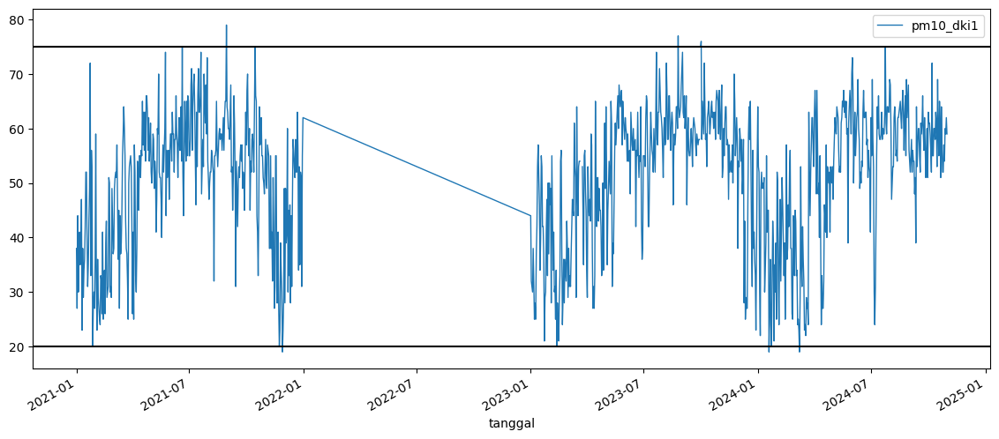

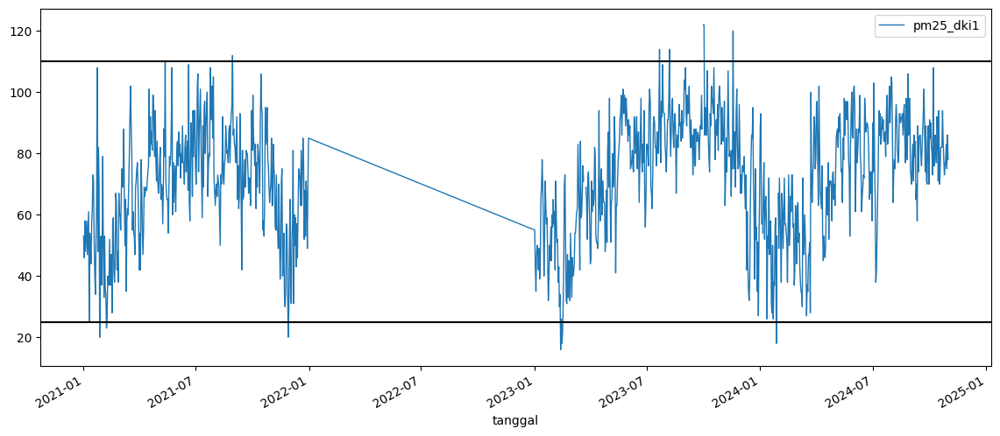

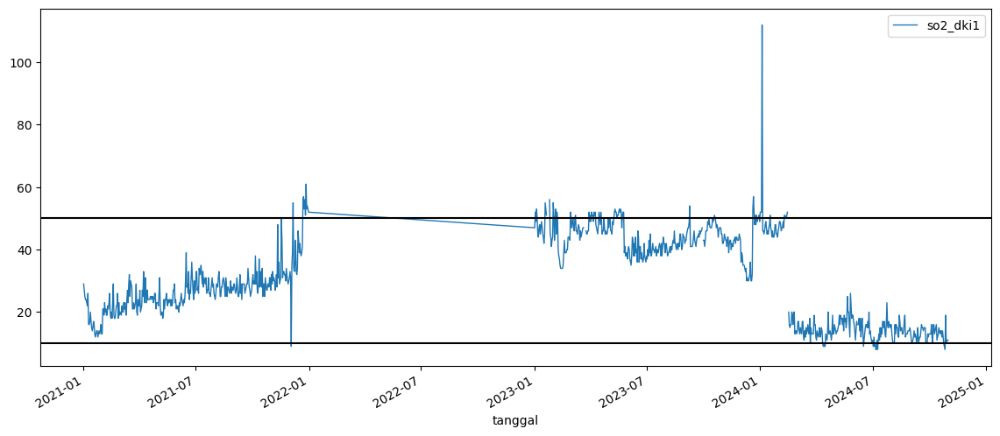

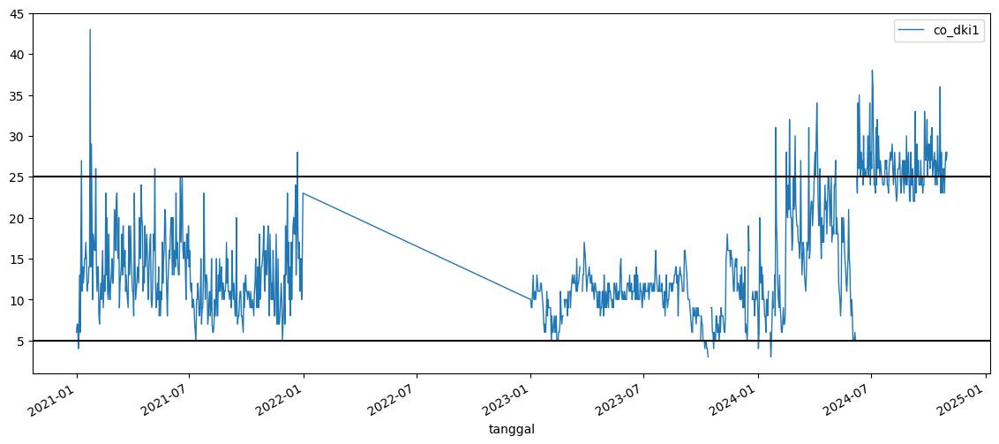

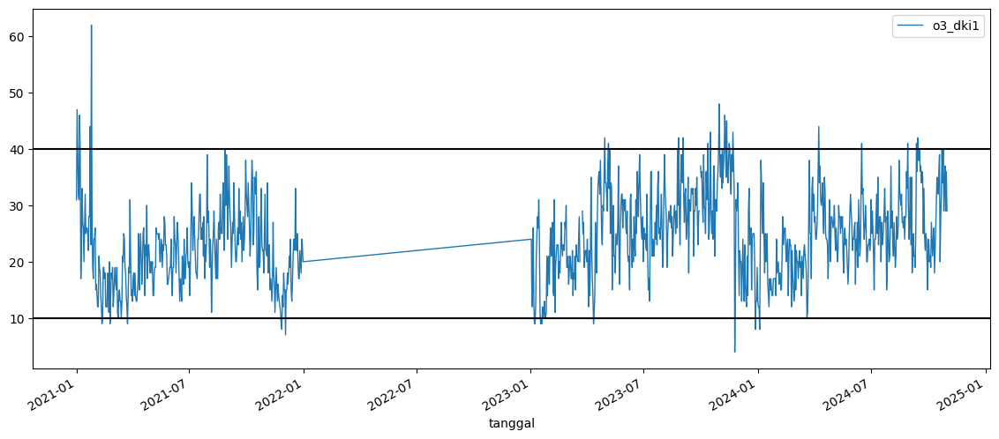

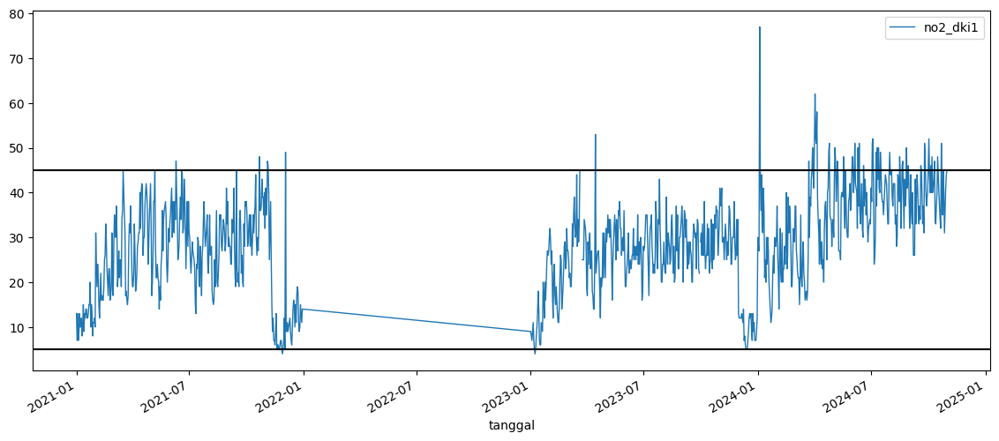

In [807]:
merge_polutan_dki1_temp = merge_polutan_dki1.copy()
merge_polutan_dki1_temp['tanggal'] = pd.to_datetime(merge_polutan_dki1_temp['tanggal'])
merge_polutan_dki1_temp = merge_polutan_dki1_temp.set_index('tanggal')

merge_polutan_dki1_temp.plot(y='pm10_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki1_temp.plot(y='pm25_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki1_temp.plot(y='so2_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki1_temp.plot(y='co_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki1_temp.plot(y='o3_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki1_temp.plot(y='no2_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

#### DKI 2

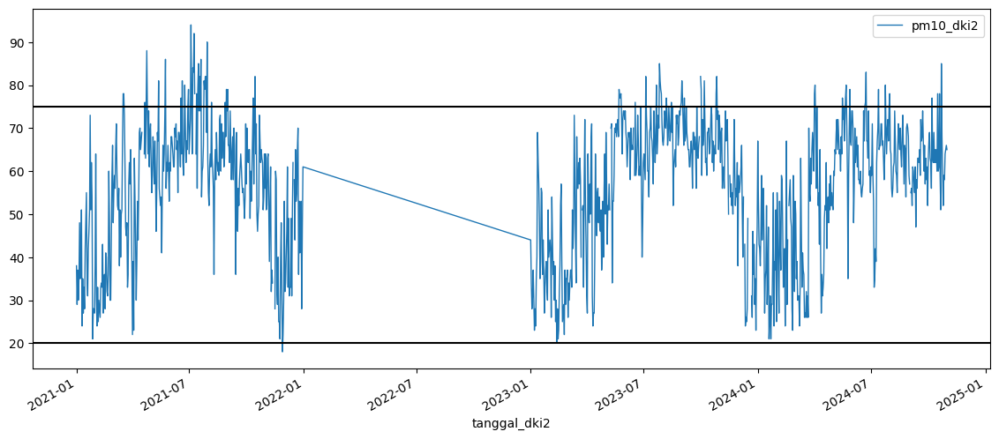

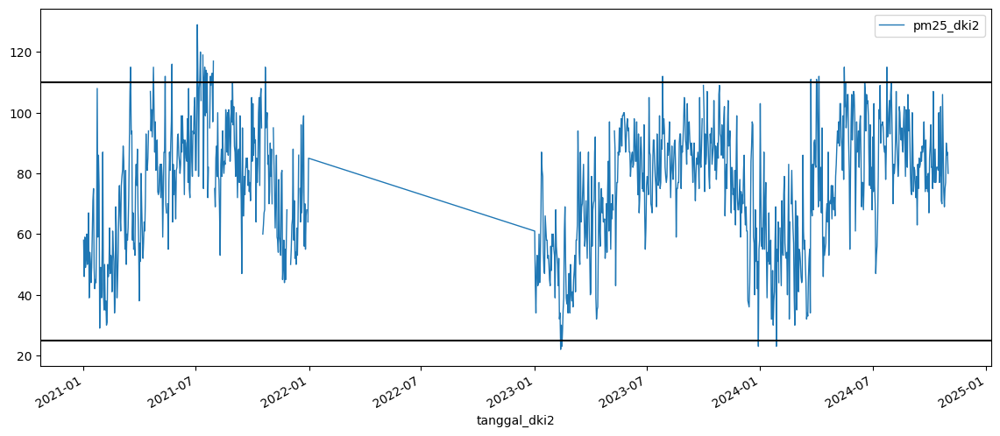

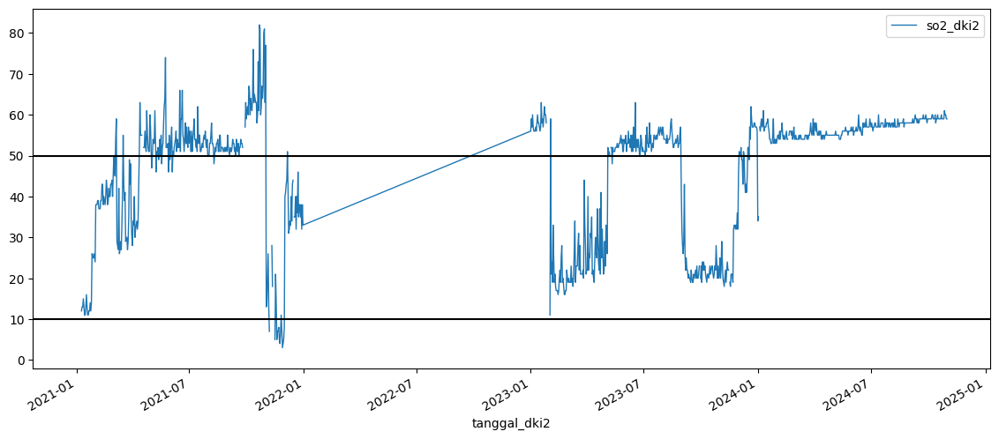

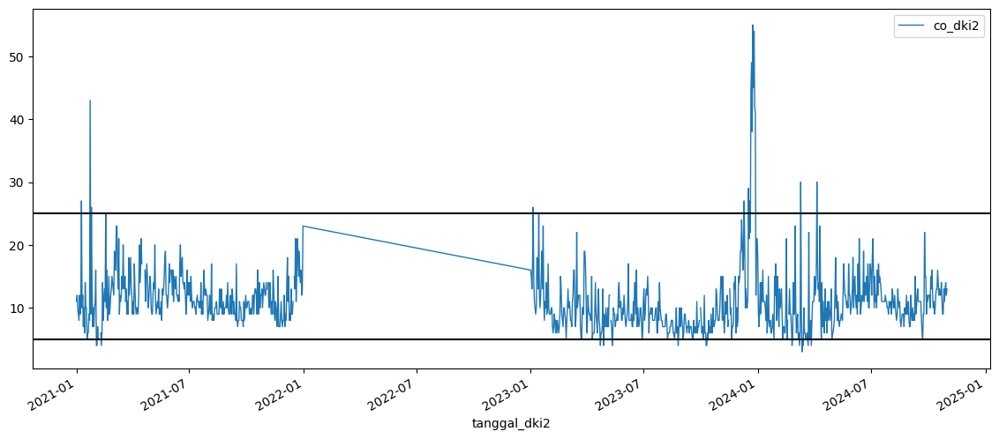

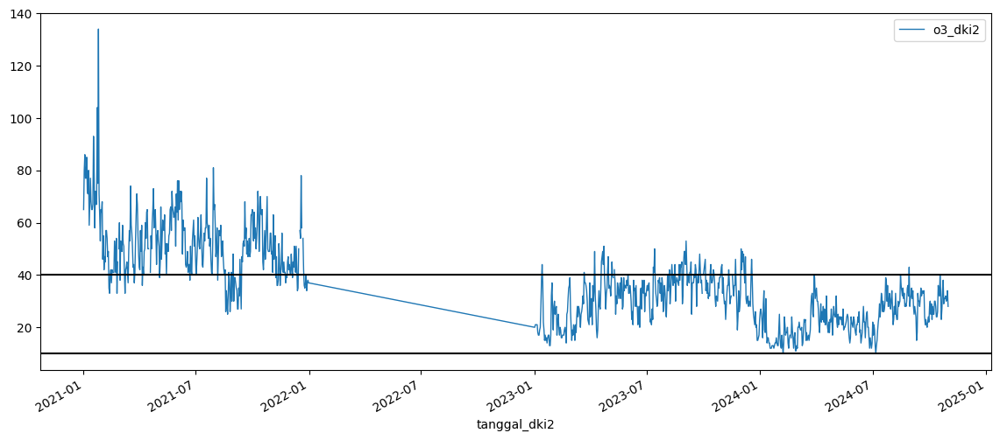

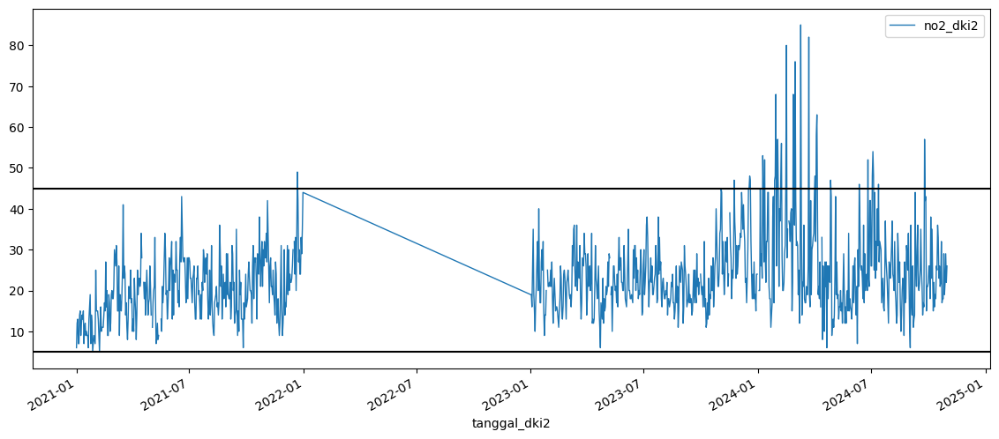

In [811]:
merge_polutan_dki2_temp = merge_polutan_dki2.copy()
merge_polutan_dki2_temp['tanggal_dki2'] = pd.to_datetime(merge_polutan_dki2_temp['tanggal_dki2'])
merge_polutan_dki2_temp = merge_polutan_dki2_temp.set_index('tanggal_dki2')

merge_polutan_dki2_temp.plot(y='pm10_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki2_temp.plot(y='pm25_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki2_temp.plot(y='so2_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki2_temp.plot(y='co_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki2_temp.plot(y='o3_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki2_temp.plot(y='no2_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

#### DKI 3

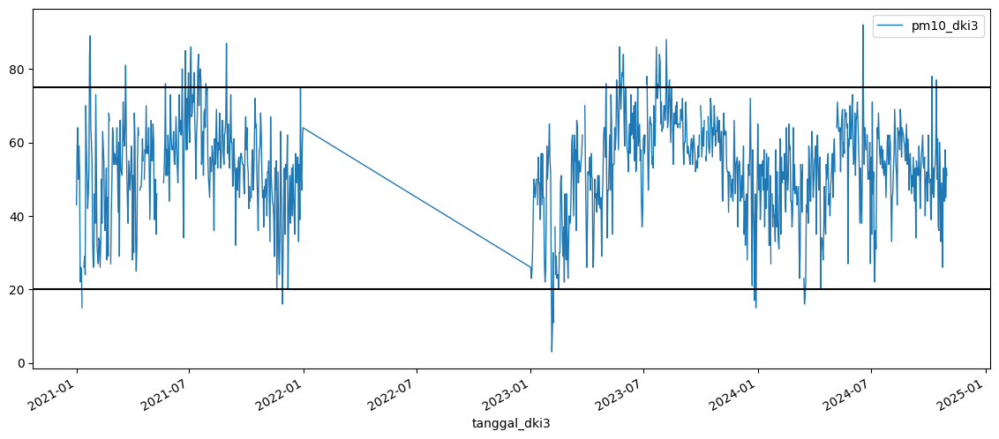

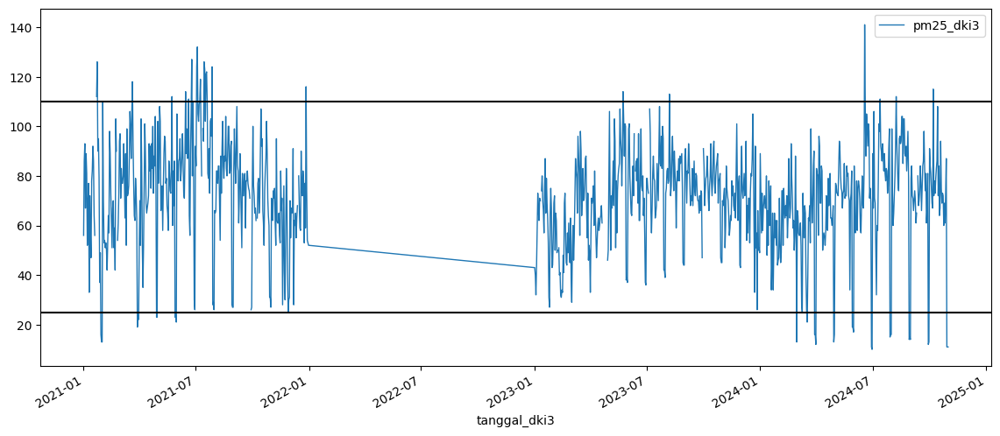

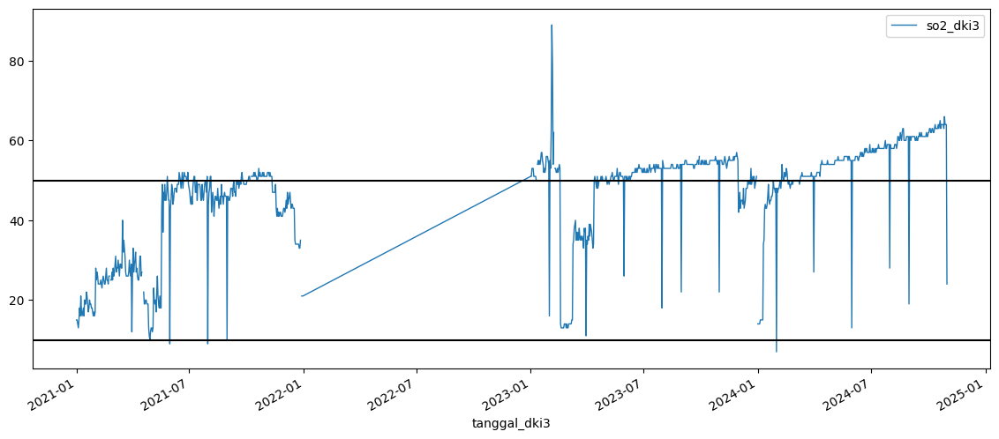

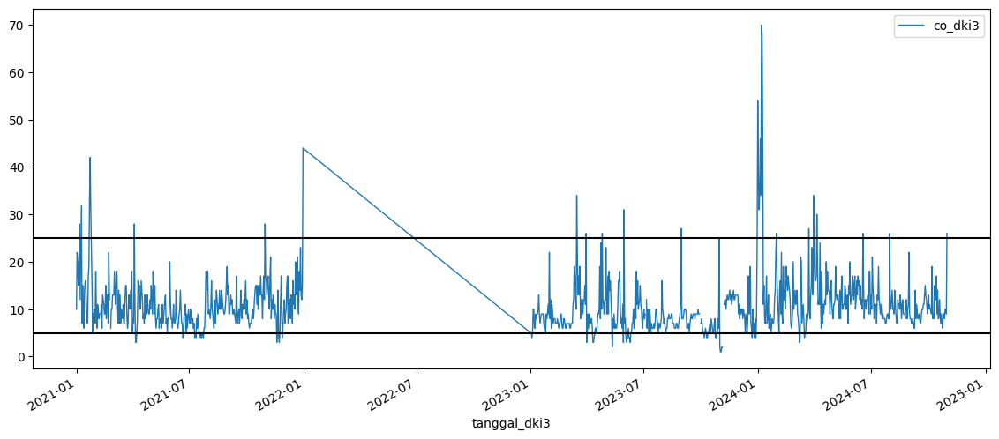

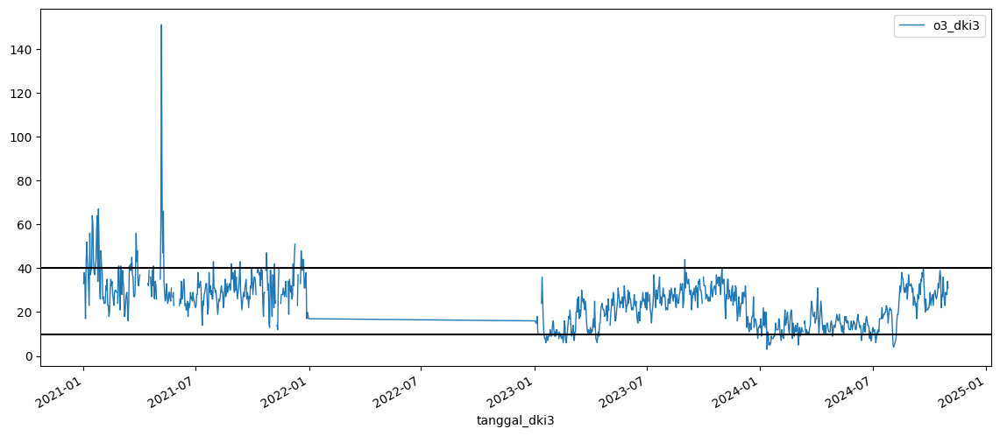

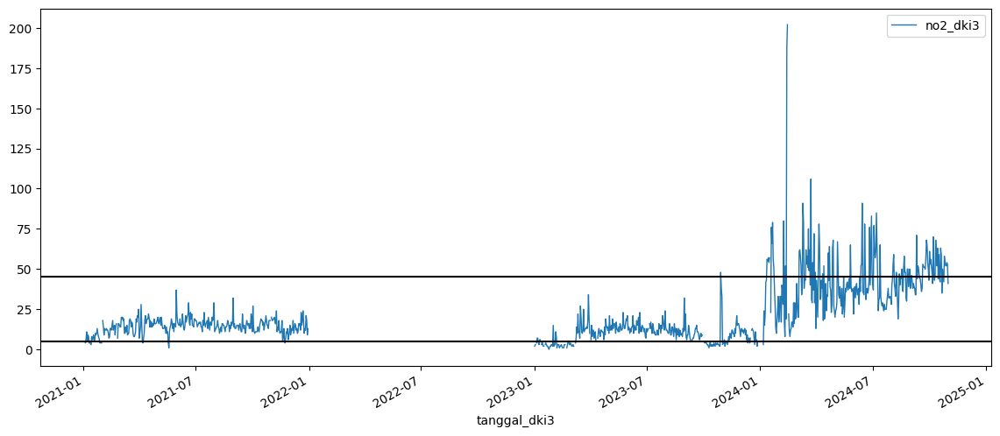

In [813]:
merge_polutan_dki3_temp = merge_polutan_dki3.copy()
merge_polutan_dki3_temp['tanggal_dki3'] = pd.to_datetime(merge_polutan_dki3_temp['tanggal_dki3'])
merge_polutan_dki3_temp = merge_polutan_dki3_temp.set_index('tanggal_dki3')

merge_polutan_dki3_temp.plot(y='pm10_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki3_temp.plot(y='pm25_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki3_temp.plot(y='so2_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki3_temp.plot(y='co_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki3_temp.plot(y='o3_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki3_temp.plot(y='no2_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

#### DKI 4

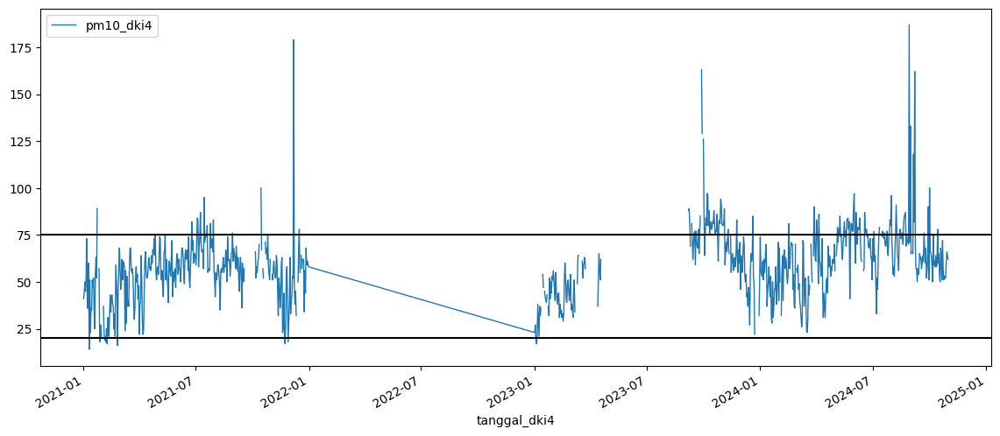

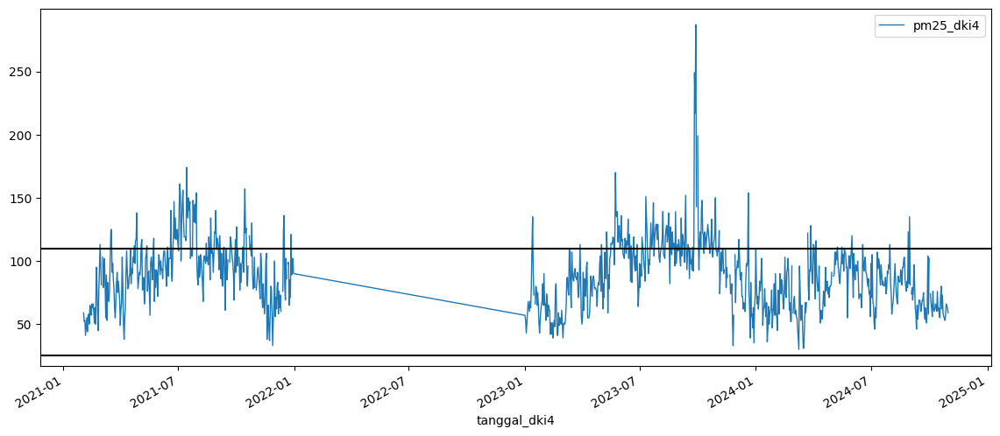

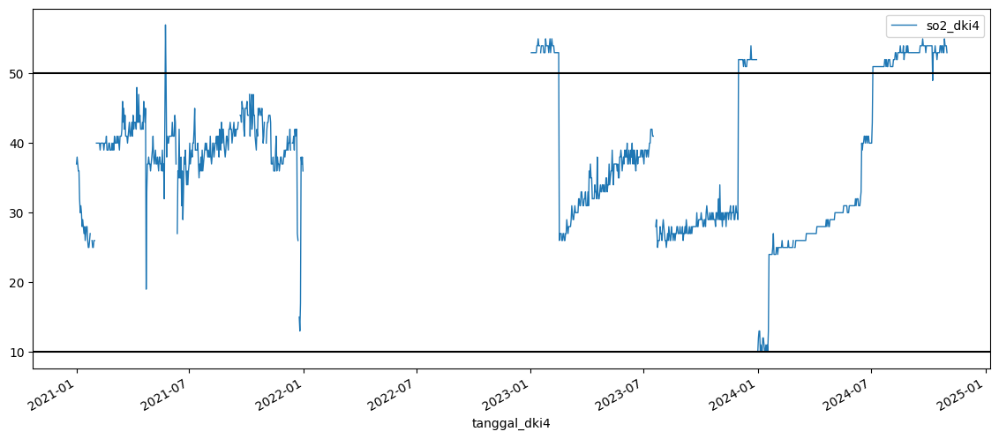

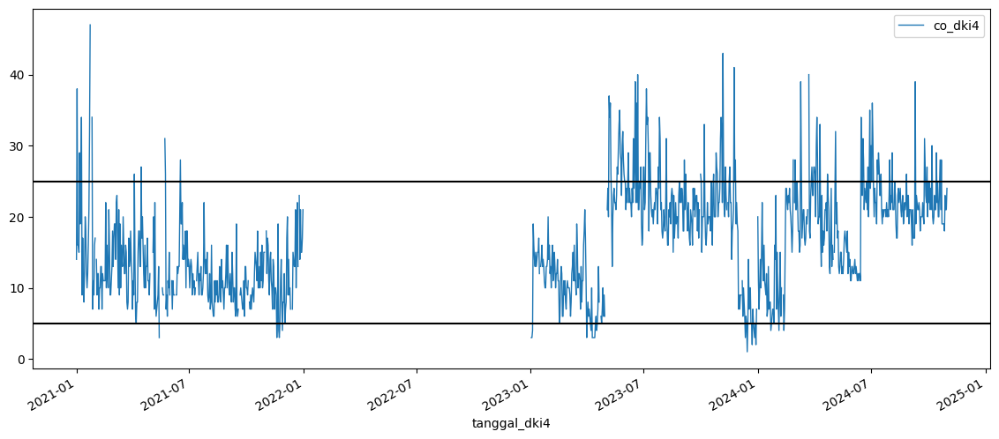

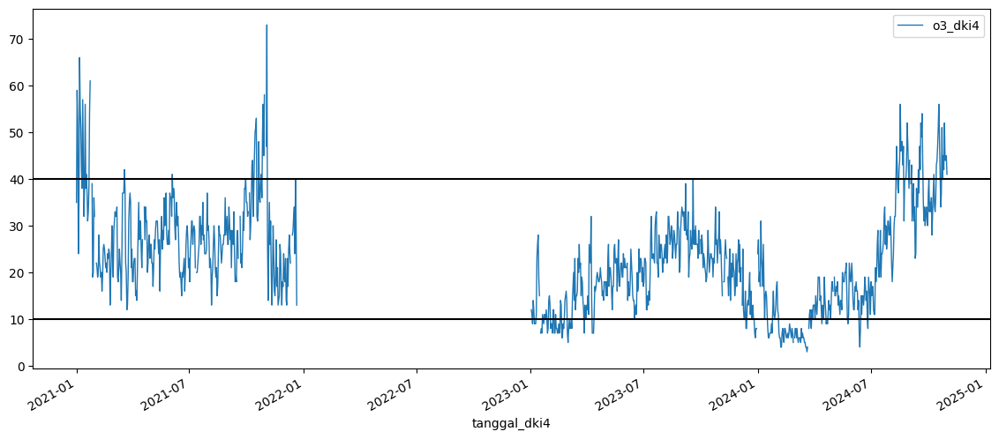

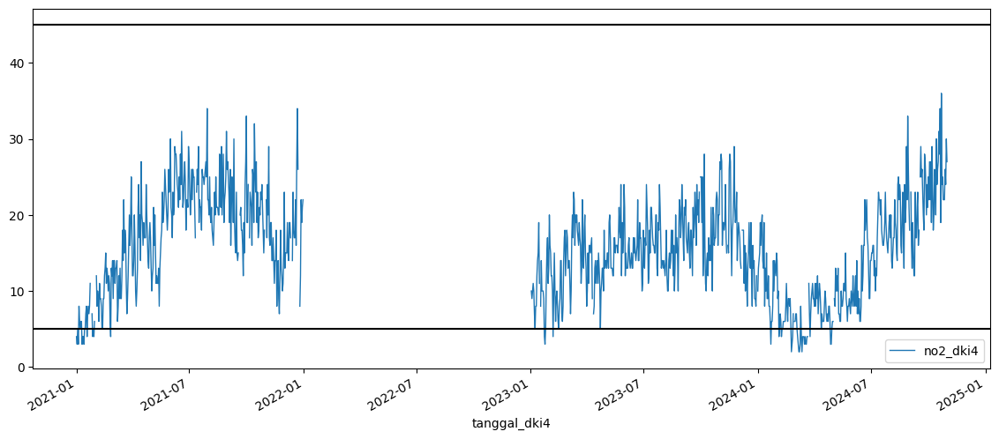

In [814]:
merge_polutan_dki4_temp = merge_polutan_dki4.copy()
merge_polutan_dki4_temp['tanggal_dki4'] = pd.to_datetime(merge_polutan_dki4_temp['tanggal_dki4'])
merge_polutan_dki4_temp = merge_polutan_dki4_temp.set_index('tanggal_dki4')

merge_polutan_dki4_temp.plot(y='pm10_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki4_temp.plot(y='pm25_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki4_temp.plot(y='so2_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki4_temp.plot(y='co_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki4_temp.plot(y='o3_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki4_temp.plot(y='no2_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

#### DKI 5

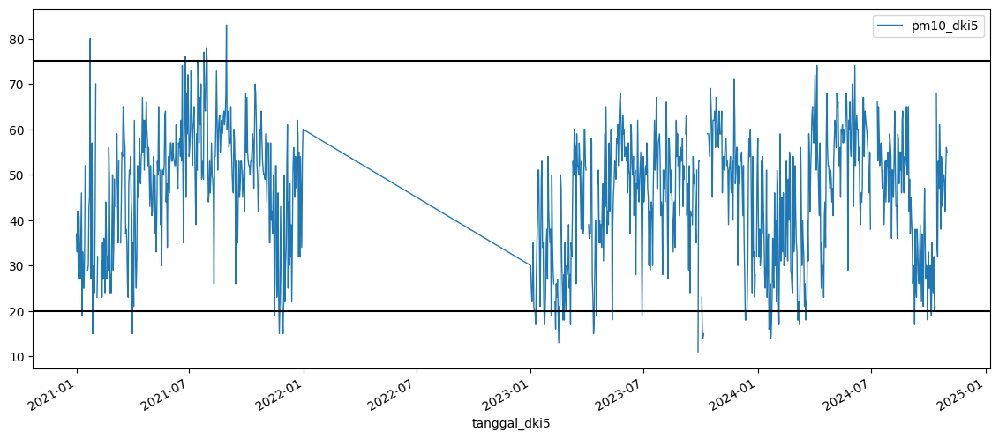

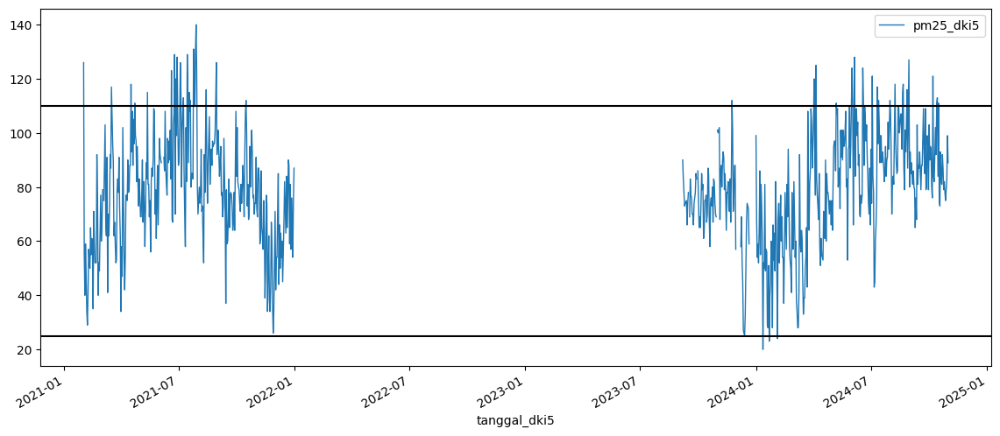

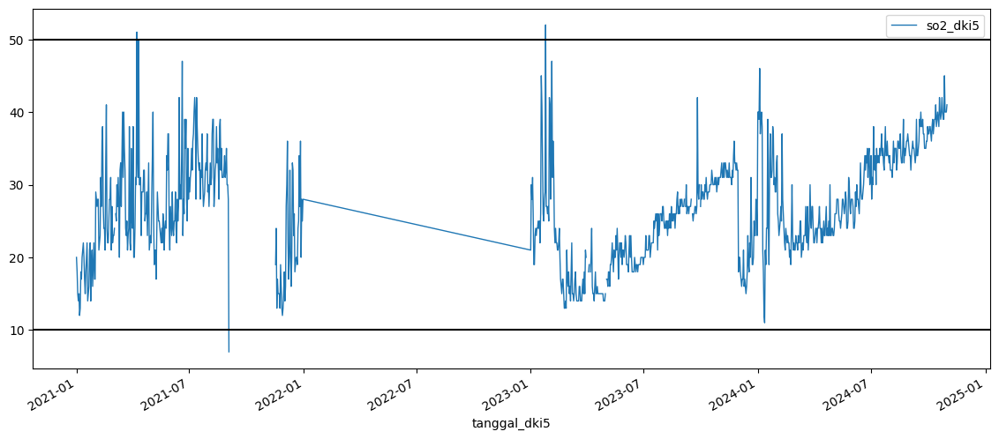

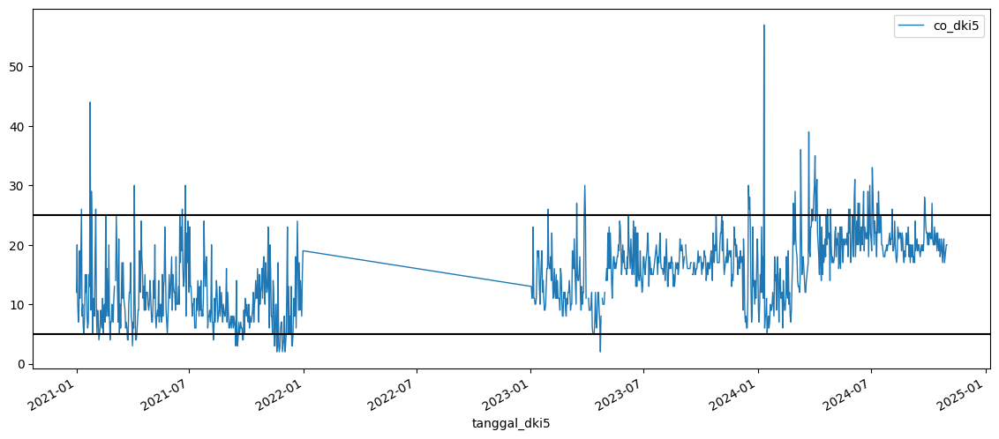

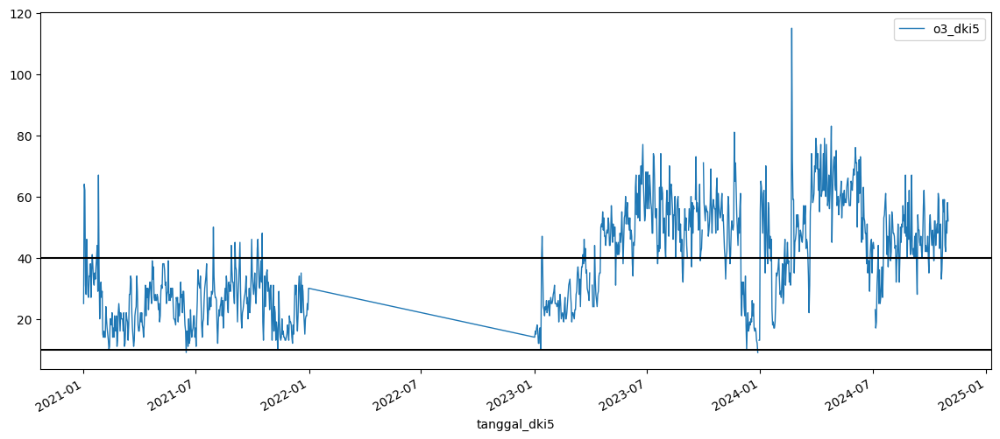

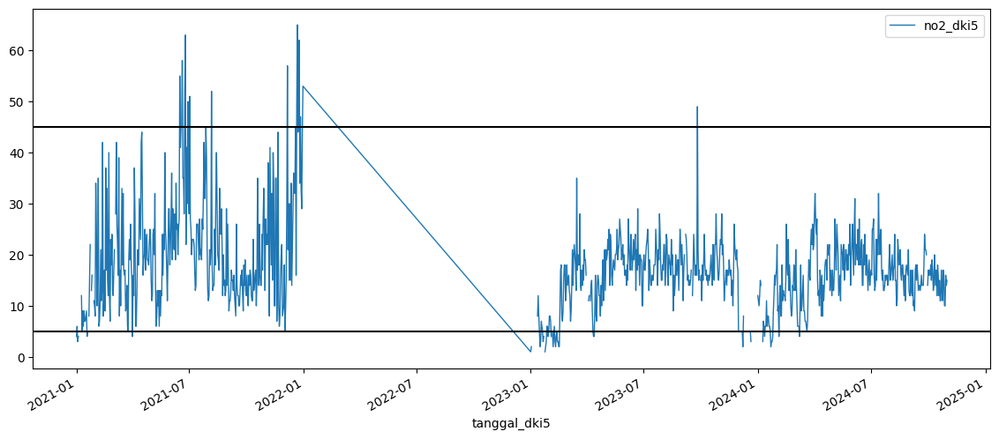

In [815]:
merge_polutan_dki5_temp = merge_polutan_dki5.copy()
merge_polutan_dki5_temp['tanggal_dki5'] = pd.to_datetime(merge_polutan_dki5_temp['tanggal_dki5'])
merge_polutan_dki5_temp = merge_polutan_dki5_temp.set_index('tanggal_dki5')

merge_polutan_dki5_temp.plot(y='pm10_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki5_temp.plot(y='pm25_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki5_temp.plot(y='so2_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki5_temp.plot(y='co_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki5_temp.plot(y='o3_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki5_temp.plot(y='no2_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

Analisis
1. PM10
- semua memiliki seasonality yang sama, namun tidak ada trend
- dki4 memiliki missing value terbanyak

2. PM2.5
- semua memiliki seasonality yang sama, namun tidak ada trend
- dki5 memiliki missing value terbanyak

3. SO2:
- DKI1: memiliki trend yang berbeda tiap tahun
- DKI2: memiliki seasonality untuk naik turun pada beberapa Waktu
- DKI3: memiliki trend menaik pada 2023-2024 & nilai fluktuatif sepanjang tahun
- DKI4: hanya memiliki trend yang menetap 2023 - mid 2024 & fluktuasi pada periode tersebut
- DKI5: memiliki trend menaik setiap tahun

hampir tidak kelihatan kemiripan nilai SO2 pada setiap wilayah dan juga masing" DKI mempunyai fluktuasi yang berbeda"

4. CO:
- DKI1, DKI4, DKI5 memiliki pola CO yang mirip
- DKI2, DKI3 memiliki pola CO yang mirip

5. O3: setiap stasiun memiliki trend & seasonality yang mirip dengan variasi intensitas O3 pada beberapa Waktu & setiap stasiun

6. NO2:
- DKI1, DKI4, DKI5 memiliki trend naik & turun pada Waktu yang mirip
- DKI2: tidak memiliki trend, hanya fluktuasi pada sekitar Q1 2024
- DKI3: 2021-2023 tidak memiliki trend, namun terjadi kenaikan NO2 sepanjang tahun 2024

### Menggabungkan semua data polutan ke axis y

In [776]:
all_merge_polutan = pd.concat([merge_polutan_dki1, merge_polutan_dki2, merge_polutan_dki3, merge_polutan_dki4, merge_polutan_dki5], axis=1)

In [777]:
all_merge_polutan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1035 entries, 0 to 1034
Data columns (total 35 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   tanggal       1035 non-null   object 
 1   pm10_dki1     1031 non-null   float64
 2   pm25_dki1     1029 non-null   float64
 3   so2_dki1      1026 non-null   float64
 4   co_dki1       1018 non-null   float64
 5   o3_dki1       1031 non-null   float64
 6   no2_dki1      1031 non-null   float64
 7   tanggal_dki2  1035 non-null   object 
 8   pm10_dki2     1014 non-null   float64
 9   pm25_dki2     1015 non-null   float64
 10  so2_dki2      1006 non-null   float64
 11  co_dki2       1022 non-null   float64
 12  o3_dki2       1026 non-null   float64
 13  no2_dki2      1020 non-null   float64
 14  tanggal_dki3  1035 non-null   object 
 15  pm10_dki3     1003 non-null   float64
 16  pm25_dki3     1014 non-null   float64
 17  so2_dki3      1024 non-null   float64
 18  co_dki3       1027 non-null 

In [778]:
all_merge_polutan = all_merge_polutan.drop(['tanggal_dki2', 'tanggal_dki3', 'tanggal_dki4', 'tanggal_dki5'], axis=1)

In [779]:
all_merge_polutan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1035 entries, 0 to 1034
Data columns (total 31 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   tanggal    1035 non-null   object 
 1   pm10_dki1  1031 non-null   float64
 2   pm25_dki1  1029 non-null   float64
 3   so2_dki1   1026 non-null   float64
 4   co_dki1    1018 non-null   float64
 5   o3_dki1    1031 non-null   float64
 6   no2_dki1   1031 non-null   float64
 7   pm10_dki2  1014 non-null   float64
 8   pm25_dki2  1015 non-null   float64
 9   so2_dki2   1006 non-null   float64
 10  co_dki2    1022 non-null   float64
 11  o3_dki2    1026 non-null   float64
 12  no2_dki2   1020 non-null   float64
 13  pm10_dki3  1003 non-null   float64
 14  pm25_dki3  1014 non-null   float64
 15  so2_dki3   1024 non-null   float64
 16  co_dki3    1027 non-null   float64
 17  o3_dki3    991 non-null    float64
 18  no2_dki3   1007 non-null   float64
 19  pm10_dki4  812 non-null    float64
 20  pm25_dki

### Visualization Bivariate

In [818]:
all_merge_polutan

,tanggal,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,...,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5
0,2021-01-01 00:00:00.000000,38.0,53.0,29.0,6.0,31.0,13.0,38.0,58.0,2.0,...,37.0,14.0,35.0,4.0,37.0,NaN,20.0,12.0,25.0,4.0
1,2021-01-02 00:00:00.000000,27.0,46.0,27.0,7.0,47.0,7.0,29.0,46.0,NaN,...,38.0,38.0,59.0,3.0,33.0,NaN,18.0,20.0,64.0,6.0
2,2021-01-03 00:00:00.000000,44.0,58.0,25.0,7.0,40.0,13.0,37.0,59.0,NaN,...,37.0,16.0,52.0,5.0,42.0,NaN,15.0,10.0,62.0,3.0
3,2021-01-04 00:00:00.000000,30.0,48.0,24.0,4.0,32.0,7.0,30.0,49.0,NaN,...,36.0,16.0,24.0,3.0,27.0,NaN,14.0,7.0,31.0,4.0
4,2021-01-05 00:00:00.000000,38.0,53.0,24.0,6.0,31.0,9.0,35.0,52.0,NaN,...,36.0,15.0,35.0,8.0,41.0,NaN,15.0,9.0,28.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1030,2024-10-27 00:00:00.000000,54.0,78.0,19.0,23.0,34.0,31.0,58.0,77.0,61.0,...,55.0,18.0,52.0,22.0,48.0,75.0,45.0,17.0,42.0,10.0
1031,2024-10-28 00:00:00.000000,60.0,83.0,10.0,26.0,37.0,36.0,64.0,90.0,60.0,...,54.0,23.0,44.0,26.0,42.0,79.0,40.0,18.0,52.0,10.0
1032,2024-10-29 00:00:00.000000,59.0,75.0,11.0,28.0,29.0,41.0,65.0,86.0,60.0,...,54.0,21.0,44.0,24.0,51.0,83.0,40.0,19.0,48.0,16.0
1033,2024-10-30 00:00:00.000000,62.0,86.0,11.0,27.0,36.0,44.0,66.0,87.0,59.0,...,54.0,21.0,45.0,30.0,56.0,99.0,40.0,20.0,58.0,14.0


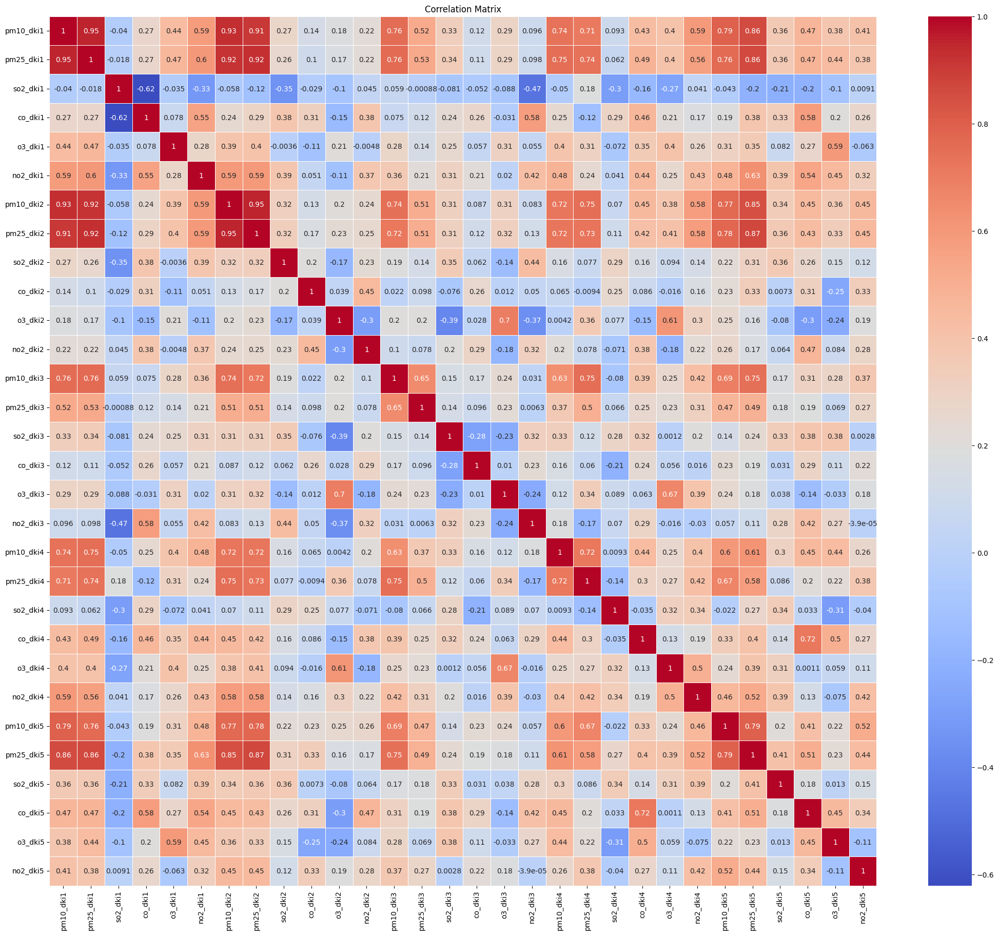

In [831]:
# all_merge_polutan.loc[:, all_merge_polutan.columns != 'tanggal'].corr()

# corr_matrix = df_selected.corr()

# Create a heatmap
plt.figure(figsize=(26, 22))
sns.heatmap(all_merge_polutan.loc[:, all_merge_polutan.columns != 'tanggal'].corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

### Proses Missing Values

In [824]:
pd.set_option("display.max_columns", None)

In [790]:
# see rows containing null values
all_merge_polutan[all_merge_polutan.isna().any(axis=1)]

,tanggal,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,...,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5
0,2021-01-01 00:00:00.000000,38.0,53.0,29.0,6.0,31.0,13.0,38.0,58.0,2.0,...,37.0,14.0,35.0,4.0,37.0,NaN,20.0,12.0,25.0,4.0
1,2021-01-02 00:00:00.000000,27.0,46.0,27.0,7.0,47.0,7.0,29.0,46.0,NaN,...,38.0,38.0,59.0,3.0,33.0,NaN,18.0,20.0,64.0,6.0
2,2021-01-03 00:00:00.000000,44.0,58.0,25.0,7.0,40.0,13.0,37.0,59.0,NaN,...,37.0,16.0,52.0,5.0,42.0,NaN,15.0,10.0,62.0,3.0
3,2021-01-04 00:00:00.000000,30.0,48.0,24.0,4.0,32.0,7.0,30.0,49.0,NaN,...,36.0,16.0,24.0,3.0,27.0,NaN,14.0,7.0,31.0,4.0
4,2021-01-05 00:00:00.000000,38.0,53.0,24.0,6.0,31.0,9.0,35.0,52.0,NaN,...,36.0,15.0,35.0,8.0,41.0,NaN,15.0,9.0,28.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
984,2024-09-11 00:00:00.000000,39.0,58.0,12.0,23.0,26.0,33.0,47.0,63.0,59.0,...,53.0,19.0,24.0,17.0,26.0,68.0,34.0,19.0,28.0,18.0
990,2024-09-17 00:00:00.000000,55.0,79.0,14.0,24.0,40.0,37.0,65.0,87.0,59.0,...,53.0,21.0,47.0,NaN,33.0,86.0,39.0,19.0,47.0,14.0
1002,2024-09-29 00:00:00.000000,60.0,89.0,12.0,32.0,20.0,39.0,61.0,80.0,58.0,...,54.0,27.0,31.0,24.0,29.0,95.0,36.0,22.0,40.0,NaN
1005,2024-10-02 00:00:00.000000,61.0,85.0,13.0,27.0,23.0,52.0,67.0,89.0,59.0,...,54.0,22.0,40.0,22.0,25.0,90.0,37.0,20.0,54.0,16.0


total data: 1035
baris yang mengandung null values: 548  

52.94% baris mengandung missing values

In [ ]:
# temp dataframe to process the missing values
temp_all_merge_polutan = all_merge_polutan.copy()
temp_all_merge_polutan.pop('tanggal')
temp_all_merge_polutan

In [135]:
imputer = KNNImputer()
imputed_all_merge_polutan = imputer.fit_transform(temp_all_merge_polutan)

In [ ]:
imputed_all_merge_polutan[1]

In [ ]:
imputed_all_merge_polutan[2]


### Visualization (Unused because Unseperated)

In [ ]:
# merge_polutan_viz = merge_polutan.copy()
# merge_polutan_viz = merge_polutan_viz.set_index('tanggal')
# merge_polutan_viz.describe()

### ======= ###
# merge_polutan_viz.plot(y='pm10', figsize=(14,6), linewidth=0.4)
# plt.axhline(y=80, color='black')
# plt.axhline(y=20, color='black')
# # plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

# merge_polutan_viz.plot(y='pm25', figsize=(14,6), linewidth=0.4)
# plt.axhline(y=130, color='black')
# plt.axhline(y=30, color='black')
# # plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

# merge_polutan_viz.plot(y='so2', figsize=(14,6), linewidth=0.4)
# plt.axhline(y=50, color='black')
# plt.axhline(y=20, color='black')
# # plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

# merge_polutan_viz.plot(y='co', figsize=(14,6), linewidth=0.4)
# plt.axhline(y=25, color='black')
# plt.axhline(y=5, color='black')
# # plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

# merge_polutan_viz.plot(y='o3', figsize=(14,6), linewidth=0.4)
# plt.axhline(y=70, color='black')
# plt.axhline(y=10, color='black')
# # plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

# merge_polutan_viz.plot(y='no2', figsize=(14,6), linewidth=0.4)
# plt.axhline(y=40, color='black')
# plt.axhline(y=5, color='black')
# # plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

# plt.show()

TRENDS:
- pm10: HAS seasonality BUT no trend WITH peak around: Dec 2021 (possibly due to new year leave), Oct 2023, Sep 2024
- pm2.5: HAS seasonality BUT no trend WITH peak around: Oct 2023
- so2: HAS slow uptrend through time WITH peak around: Jan & Dec 2023
- co: NO visible trend BUT more fluctuative through time WITH certain peak around: Dec 2023 (possibly due to new year leave)
- o3: HAS seasonality BUT no trend WITH peak around: Jan & May 2021, Mar 2024
- no2: HAS uptrend in 2024 WITH peak around: Mar 2024

Trend Inferences:
1. O3 & No2: may have correlation because has similar peak in 2024
2. SO2 & CO: may have correlation because has similar peak and slightly has uptrend in 2024
3. PM10 & PM2.5: has similar seasonality because they are Particulate Matter